# Crafting and learning features

In this tutorial we will learn how to build and analyze a faces dataset, in ordert to obtain some facial features that we will use later on to classify and identify new faces (not part of the initial dataset).

For the section numbering, we will stick to the numbering given in the assignment, so the first section is section 3: building a faces dataset.

# 3. Building a faces dataset

First of all, we need to build our faces dataset. 

For this, we will make use of the publicly available [VGG Face Dataset](https://www.robots.ox.ac.uk/~vgg/data/vgg_face/). The dataset consists of the crawled images of celebrities on the Web. There are 2622 celebrities from all around the world in the dataset and the dataset is designed to have no overlap with other popular datasets.

The images are covered under a Creative Commons Attribution-NonCommercial 4.0 International license.

## 3.1. Loading the dataset

The following code snippet will load the dataset and unzip it. The content will be then available to use inside this Google Colab notebook, under the `vgg_face_dataset/files` path.

We will also load a pre-trained model from OpenCV for face detection(`haarcascade_frontalface_default`), as we will use it to test if the faces included in our dataset are easily detectable.

In [0]:
import os
import cv2
import tarfile
import numpy as np
from urllib import request
from google.colab import drive
from google.colab.patches import cv2_imshow

# Define base path for dataset
base_path = "/content/sample_data/CV__Group_assignment"

# Create the folder if it doesn't exist
if not os.path.isdir(base_path):
  os.makedirs(base_path)

# Load the dataset url, unzip it, and save it
vgg_face_dataset_url = "http://www.robots.ox.ac.uk/~vgg/data/vgg_face/vgg_face_dataset.tar.gz"

with request.urlopen(vgg_face_dataset_url) as r, open(os.path.join(base_path, "vgg_face_dataset.tar.gz"), 'wb') as f:
  f.write(r.read())

with tarfile.open(os.path.join(base_path, "vgg_face_dataset.tar.gz")) as f:
  f.extractall(os.path.join(base_path))

# Load a pre-trained face detecting model
trained_haarcascade_url = "https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/haarcascade_frontalface_default.xml"

with request.urlopen(trained_haarcascade_url) as r, open(os.path.join(base_path, "haarcascade_frontalface_default.xml"), 'wb') as f:
    f.write(r.read())

## 3.2. Selecting subjects and downloading pictures

We need to select 4 subjects in total. 

Subjects A and B need to be significantly different from each other, but they have to be similar to subject C and D respectively. The characteristics that make us consider two subjects as similar or different are very broad and are left to the user's own judgement. Nevertheless, some examples could be:
- Gender
- Hairstyle and color
- Use of glasses
- Facial hair

In this tutorial, we chose the following subjects:
- A: Gordom Ramsay
- B: Jennifer Morrison
- C: Hugh Laurie
- D: Margot Robbie

![Gordon Ramsay](https://raw.githubusercontent.com/Nicocro/CV_Assignments/master/Dataset_Faces/SubjectA_GR/GR_1.png)
![Jennifer Morrison](https://raw.githubusercontent.com/Nicocro/CV_Assignments/master/Dataset_Faces/SubjectB_JM/JM_1.png)
![Hugh Laurie](https://raw.githubusercontent.com/Nicocro/CV_Assignments/master/Dataset_Faces/SubjectC_HL/HL_1.png)
![Margot Robbie](https://raw.githubusercontent.com/Nicocro/CV_Assignments/master/Dataset_Faces/SubjectD_MR/MR_3.png)

Before making this decision, we performed a similarity check using the Face++ API and some of the available images on the VGG Faces dataset, and found that these subject pairs (A,C and B,D) share enough features for the objective of the assignment.

The following code snippet shows how the download process can be carried out. Make sure to follow it closely and read the comments. It may take a while to download all the images. The resulting images are shown beneath the code block. 

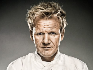

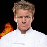

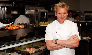

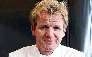

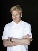

...

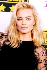

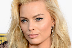

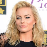

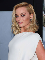

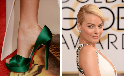

In [2]:
# Define the subjects that form the dataset
# params:
#   name: name of the subject
#   nimages: number of images to download
#   images: array storing the downloaded images
#   skip_ids: array of images's ids to skip during the download process. 
#             Some images in the VGG dataset show the subject with more people, 
#             or in situations where their face is not clearly visible, so these images should not be part of our dataset
subj_dict = {
    "subjectA": {
        "name": "Gordon_Ramsay.txt",
        "nimages": 30,
        "images": [],
        "skip_ids": [1,3,4,5,12,43,63,65,66,71,78,83,89,92]
    },
    "subjectB": {
        "name": "Jennifer_Morrison.txt",
        "nimages": 30,
        "images": [],
        "skip_ids": [8,17,19,21,23,24,34,73]
    },
    "subjectC": {
        "name": "Hugh_Laurie.txt",
        "nimages": 10,
        "images": [],
        "skip_ids": [3,6,10,11,14,29,31,32,35,40,43]
    },
    "subjectD": {
        "name": "Margot_Robbie.txt",
        "nimages": 10,
        "images": [],
        "skip_ids": [13]
    }
}

# Download the requested amount of images for each subject
for subject in subj_dict:

  # Open file for the given subject
  with open(os.path.join(base_path, "vgg_face_dataset", "files", subj_dict[subject]["name"]), 'r') as f:
    lines = f.readlines()

  images_ = []
  skip_counter = 1 # 1-indexed, as in the files
  for line in lines:
    # Extract the image url
    url = line[line.find("http://"): line.find(".jpg") + 4]
    # Skip image if its id is part of the skips_ids array
    if skip_counter in subj_dict[subject]["skip_ids"]:
      skip_counter += 1
      continue
    
    # Some links are broken and the image won't load, so we need to wrap our code in a try-except block
    try:
      # Fetch the image and decode it using cv2.imdecode
      res = request.urlopen(url)
      img = np.asarray(bytearray(res.read()), dtype="uint8")
      img = cv2.imdecode(img, cv2.IMREAD_COLOR)
      h, w = img.shape[:2]
      images_.append(img)
      # Show the downloaded image
      cv2_imshow(cv2.resize(img, (w // 5, h // 5)))
      # Add image to array if the limit hasn't been reached
      if len(subj_dict[subject]["images"]) < subj_dict[subject]["nimages"]:
        subj_dict[subject]["images"].append(img)
      else:
        # Stop searching for images when we reach the limit
        break

    except:
      pass
    skip_counter += 1

Once we have built our faces dataset, we will use the preloaded face-detection model on our images. 

This is an effective way of ensuring that the faces are clear enough to be detected by our algorithms.

Found 1 face(s)!


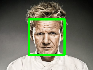

Found 1 face(s)!


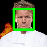

Found 1 face(s)!


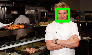

Found 1 face(s)!


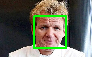

Found 1 face(s)!


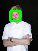

Found 1 face(s)!


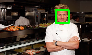

Found 1 face(s)!


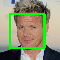

Found 1 face(s)!


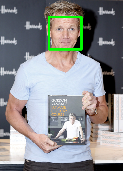

Found 1 face(s)!


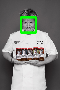

Found 1 face(s)!


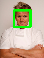

Found 1 face(s)!


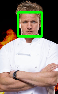

Found 1 face(s)!


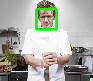

Found 1 face(s)!


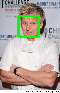

Found 1 face(s)!


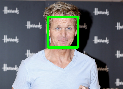

Found 1 face(s)!


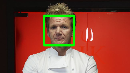

Found 1 face(s)!


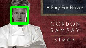

Found 1 face(s)!


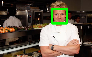

Found 1 face(s)!


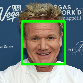

Found 1 face(s)!


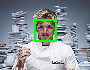

Found 1 face(s)!


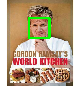

Found 1 face(s)!


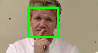

Found 1 face(s)!


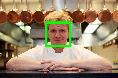

Found 1 face(s)!


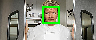

Found 1 face(s)!


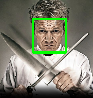

Found 1 face(s)!


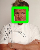

Found 1 face(s)!


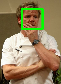

Found 1 face(s)!


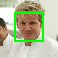

Found 1 face(s)!


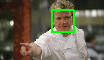

Found 1 face(s)!


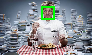

Found 1 face(s)!


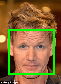

Found 1 face(s)!


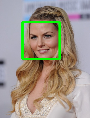

Found 1 face(s)!


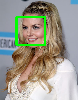

Found 1 face(s)!


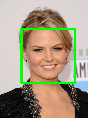

Found 1 face(s)!


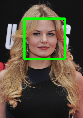

Found 1 face(s)!


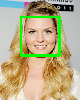

Found 1 face(s)!


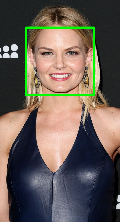

Found 1 face(s)!


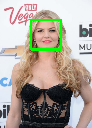

Found 1 face(s)!


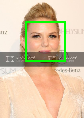

Found 1 face(s)!


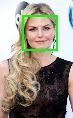

Found 1 face(s)!


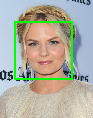

Found 1 face(s)!


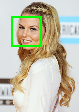

Found 1 face(s)!


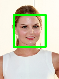

Found 1 face(s)!


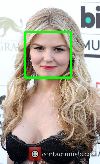

Found 1 face(s)!


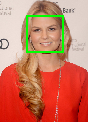

Found 1 face(s)!


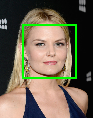

Found 1 face(s)!


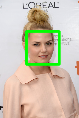

Found 1 face(s)!


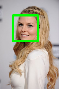

Found 1 face(s)!


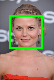

Found 1 face(s)!


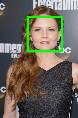

Found 1 face(s)!


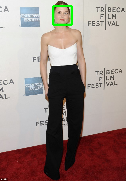

Found 1 face(s)!


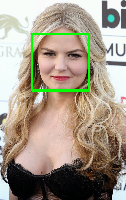

Found 1 face(s)!


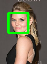

Found 1 face(s)!


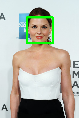

Found 1 face(s)!


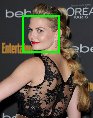

Found 1 face(s)!


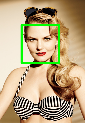

Found 1 face(s)!


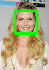

Found 1 face(s)!


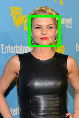

Found 1 face(s)!


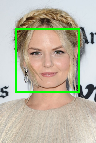

Found 1 face(s)!


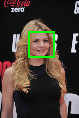

Found 1 face(s)!


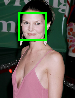

Found 1 face(s)!


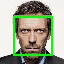

Found 1 face(s)!


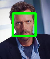

Found 1 face(s)!


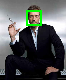

Found 1 face(s)!


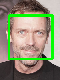

Found 1 face(s)!


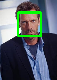

Found 1 face(s)!


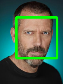

Found 1 face(s)!


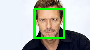

Found 1 face(s)!


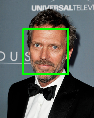

Found 1 face(s)!


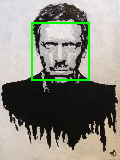

Found 1 face(s)!


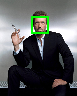

Found 1 face(s)!


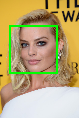

Found 1 face(s)!


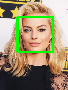

Found 1 face(s)!


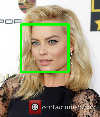

Found 1 face(s)!


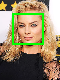

Found 1 face(s)!


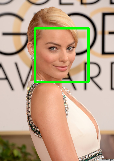

Found 1 face(s)!


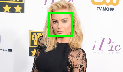

Found 1 face(s)!


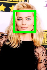

Found 1 face(s)!


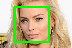

Found 1 face(s)!


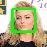

Found 1 face(s)!


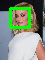

In [3]:
# Detect faces on the downloaded images
faceCascade = cv2.CascadeClassifier(os.path.join(base_path, "haarcascade_frontalface_default.xml"))

for subject in subj_dict:
  images = subj_dict[subject]["images"]
  for img in images:
    img_ = img.copy()
    img_gray = cv2.cvtColor(img_, cv2.COLOR_BGR2GRAY)
    # Use face cascade to detect the face
    faces = faceCascade.detectMultiScale(
        img_gray,
        scaleFactor=1.2,
        minNeighbors=5,
        minSize=(30, 30),
        flags=cv2.CASCADE_SCALE_IMAGE
    )
    print("Found {} face(s)!".format(len(faces)))

    # Show a green rectangle over the detected face
    for (x, y, w, h) in faces:
        cv2.rectangle(img_, (x, y), (x+w, y+h), (0, 255, 0), 10)

    h, w = img_.shape[:2]

    cv2_imshow(cv2.resize(img_, (w // 5, h // 5)))

## 3.3. Save the images locally

The images can be saved locally (to the Colab notebook) for later use. 

**Bear in mind that they won't persist between sessions.**

In [0]:
# save the images in /content/dataset/subjectX
import os
from pathlib import Path

for subject in subj_dict:
  for i in range(0,len(subj_dict[subject]["images"])):
    imgname = "image_" + str(i) + ".png"
    path = os.path.join(os.getcwd(), 'dataset', subject)
    Path(path).mkdir(parents=True, exist_ok=True)
    imgpath = os.path.join(path, imgname)
    img = subj_dict[subject]["images"][i]
    cv2.imwrite(imgpath, img)

## 3.4. Results

After running the code, we have:
- 20 training and 10 testing images of person A
- 20 training and 10 testing images of person B
- 10 testing images of person C, who looks similar to person A
- 10 testing images of person D, who looks similar to person B

We will use these images to train and test the extracted features, and classify new images later on.

As a last step, we preprocessed the images. The preprocessing step is performed offline and consists of the following steps:

*   Create equal-resolution images for the entire dataset (here: 64x64)
*   Centralize the faces in the images

This improves the efficiency of some algorithms and makes working with the dataset much easier. The first step is also required for the HOG algorithm.

The preprocessed dataset can be found on [GitHub](https://github.com/Nicocro/CV_Assignments/tree/master/Dataset_Faces). Uploading the dataset to GitHub makes fetching the images simpler, and the building process does not need to be run every time.

# 4. Building feature representations

## 4.1 Handcrafted features

Now that we have our dataset, we can start extracting facial features.

Handcrafted feature descriptors are extracted from the image itself, using a specific deterministic algorithm. 

Handcrafted features were commonly used in traditional machine learning approaches and we still see them today in complicated machine learning tasks e.g. doing machine learning on a manifold mesh.

There are several existing algorithms that perform this task. Two of the most widely-used state-of-the-art algorithms are **[Histogram of Oriented Gradients(HOG)](https://www.learnopencv.com/histogram-of-oriented-gradients/)** and **[Scale-Invariant Feature Transform(SIFT)](https://docs.opencv.org/3.4/da/df5/tutorial_py_sift_intro.html)**. However, we will only extract features using HOG, as the SIFT algorithm is patented and not included in the OpenCV version provided by Google Colab, which complicates the task at hand.

### 4.1.1 Histogram of Oriented Gradients

This method is primarily based on the gradient values of the pixels within the image. Before starting the actual calculations, the preprocessed images are downloaded and stored within a dictionary.
 
The preprocessing step especially is important for the HOG algorithm. The reason why will be explained later.

We first start by initializing some variables and by downloading the preprocessed images of our dataset.

In [0]:
# Step 0: some initialization
import os
import requests
import numpy as np
import cv2
from pathlib import Path
from google.colab.patches import cv2_imshow

subj_dict = {
    "SubjectA_GR": {
        "nimages": 20,
        "images": [],
        "nimages_test": 10,
        "images_test": [],
        "fvectors_hog": [],
        "fvectors_hog_test": []
    },
    "SubjectB_JM": {
        "nimages": 20,
        "images": [],
        "nimages_test": 10,
        "images_test": [],
        "fvectors_hog": [],
        "fvectors_hog_test": []
    },
    "SubjectC_HL": {
        "nimages": 10,
        "images": [],
        "fvectors_hog": []
    },
    "SubjectD_MR": {
        "nimages": 10,
        "images": [],
        "fvectors_hog": []
    }
}

In [6]:
# Step 1: download the preprocessed images

def download_images():
  base_url = 'https://raw.githubusercontent.com/Nicocro/CV_Assignments/master/Dataset_Faces/'

  for celeb in subj_dict:
    print("Downloading images for {}".format(celeb))

    # Train images
    specific_url = base_url + celeb
    for i in range(0,subj_dict[celeb]["nimages"]):
      specific_file = specific_url + '/' + celeb[-2:] + '_' + str(i) + '.png'
      r = requests.get(specific_file)
      nparr = np.asarray(bytearray(r.content), dtype="uint8")
      image = cv2.imdecode(nparr, cv2.IMREAD_COLOR)
      subj_dict[celeb]["images"].append(image)

    # Test images
    if("nimages_test" in subj_dict[celeb]):
      specific_url = base_url + celeb[-4:-3] + "_test"
      for i in range(0,subj_dict[celeb]["nimages_test"]):
        specific_file = specific_url + "/" + celeb[-4:-3] + "_test_" + celeb[-2:] + "_" + str(i) + ".png"
        r = requests.get(specific_file)
        nparr = np.asarray(bytearray(r.content), dtype="uint8")
        image = cv2.imdecode(nparr, cv2.IMREAD_COLOR)
        subj_dict[celeb]["images_test"].append(image)
  print("...done!")

download_images()

...done!


#### **Explanation of the HOG Algorithm**
To understand the inner workings of this method, we will be working with one image. Every code block will show one step of the algorithm until the entire feature vector is computed. We will first select a full color image from one of the subjects.

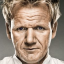

In [7]:
demo_image = subj_dict["SubjectA_GR"]["images"][0]
cv2_imshow(demo_image)

##### **Applying Sobel edge detection**

Using this image, we can use Sobel edge detection to find the gradients in both x and y direction of the image. 

Gradients in the X direction


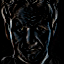

Gradients in the Y direction


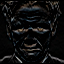

In [8]:
demo_image = np.float32(demo_image)
gx = cv2.Sobel(demo_image, cv2.CV_32F, 1, 0, ksize=1)
gy = cv2.Sobel(demo_image, cv2.CV_32F, 0, 1, ksize=1)

print("Gradients in the X direction")
cv2_imshow(gx)
print("Gradients in the Y direction")
cv2_imshow(gy)

##### **Calculating magnitude and angle vectors**
For the HOG algorithm, we would like to calculate the feature vector based on the magnitude and angles of the gradients. To do this, we will have to transform the coordinate system from carthesian coordinates to polar coordinates. Given that we have the gradients in both X and Y directions, this can be easily achieved by the following formulas:

*   magnitude = $\sqrt{g_x^2 + g_y^2}$
*   angle = $\arctan{\frac{g_y}{g_x}}$

The openCV implementation for the HOG algorithm uses unsigned gradients (between 0 and 180°). 

The image obtained by taking the magnitude of the gradients in both directions is shown.





/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


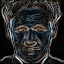

In [9]:
mag = (gx**2 + gy**2)**(1/2)
theta = np.arctan(gy/gx)
cv2_imshow(mag)

##### **Histogram construction**
We could be using a combination of the magnitude and angles as feature representation. However, these individual pixel values might have too large of an influence on the classification algorithm. In addition, this would create a very large feature vector. To combat this, the algorithm subdivides the image into 8x8 grids and computes a histogram for every grid based on the angles and the magnitudes. For every 8x8 grid (thus containing 64 pixels/color) the histogram is computed as follows:

*   Create a histogram with n bins. Every bin is a range of angles. For example, a histogram of 9 bins allows for grouping angles of degres [0,20), [20,40) ...
*   For every pixel value, add the magnitude value to a bin, based on the angle of the gradient in that pixel value.

For n bins, every histogram can be represented as an array of n elements. So the feature vector of a 8x8 grid has been reduced from 8x8x2=128 elements to 9 elements. 

This also shows the importance of preprocessing the images to a specified resolution. The image resolution should be a multiple of the grid size (and block size, see below) in both directions. Without this preprocessing step, some pixel values will have to be artificially created resulting in skewed histograms and thus worse classification.



##### **Histogram normalization**

To improve results, every histogram vector is normalized to prevent effects from lighting in the image. This can be done by means of applying the L2-norm. To further optimize the results, instead of normalizing every histogram vector by itself, multiple histogram vectors are concatenated and normalized together. This is done by moving a 16x16 grid (called blocks) over the image. Our implementation uses 16x16 block sizes and moves each block by 8 pixels in both x and y directions. It concatenates the feature vectors of the 4 histograms in every block (resulting in a 36 element vector) and normalizes it using the L2-norm. For a 64x64 image, there are 7x7 possible block positions. So for every image one can gather a feature vector of 1764 elements:



*   Possible block positions in X direction: $\frac{64px}{8px} - 1 = 7$
*   Possible block positions in Y direction: $7$ (same as X)
*    Shape of feature vector in every block: $9 \frac{elements}{grid} * 4 \frac{grids}{block} = 36 \frac{elements}{block}$

Total: 7 x 7 x 36 = 1764

These calculations can be verified by checking the output feature vector shape of the openCV implementation for this algorithm. 


In [10]:
demo_image = np.uint8(demo_image)
hog = cv2.HOGDescriptor(_winSize=(64,64), _blockSize=(16,16), _blockStride=(8,8), _cellSize=(8,8), _nbins=9)
features = hog.compute(demo_image)
print(features.shape)

(1764, 1)


#### **Algorithm application**
Now we're ready to apply this algorithm on every image of the dataset. We define it as a function as we will be needing this implementation later on.

In [0]:
# Step 2: Extracting the features and adding them to the subject dictionary
def computeHOG():
  hog = cv2.HOGDescriptor(_winSize=(64,64), _blockSize=(16,16), _blockStride=(8,8), _cellSize=(8,8), _nbins=9)
  for celeb in subj_dict:
    subj_dict[celeb]["fvectors_hog"] = []
    subj_dict[celeb]["fvectors_hog_test"] = []
    for img in subj_dict[celeb]["images"]:
      img = np.uint8(img)
      features = hog.compute(img)
      features = np.ndarray.flatten(features)
      subj_dict[celeb]["fvectors_hog"].append(features)
    
    if("images_test" in subj_dict[celeb]):
      for img in subj_dict[celeb]["images_test"]:
        img = np.uint8(img)
        features = hog.compute(img)
        features = np.ndarray.flatten(features)
        subj_dict[celeb]["fvectors_hog_test"].append(features)

if len(subj_dict["SubjectA_GR"]["fvectors_hog"]) is 0:
  computeHOG()

And we are done. Our `subj_dict` variable now contains the feature vector of every image in the dataset.

#### **Comparison to other grabbing techniques**
In the individual assignment, a circular object was grabbed by applying the Hough circle transform to the image. While both this method and the HOG descriptor use some form of edge detection, the results are used differently. For the individual assignment, the edges were used to calculate the accumulator which was in turn used to predict where the object was placed. In this assignment, the edges are used to calculate the magnitude and angle of the gradients in both directions. 


## 4.2 Learning Features from Data

An alternative approach to handcrafting features that capture desired object properties is to learn these features from training data.



### 4.2.1 Unsupervised Learning: PCA

PCA is an unsupervised learning approach to find different components of variation present in our faces training set. 



#### PCA background theory




##### **Rationale**

Our aim is to learn which are the "building blocks" of a face and try to describe any face as a linear combination of those general building blocks. 
In order to do that we need to understand how different faces share some characteristics and which are the characteristics (features) that varies the most. Those features expressing highest _variance_ are exactly what we are looking for, since they would capture the main different elements of which a face is composed by and thus will become our "building blocks" (eigenfaces). 
The problem translates into calculating the covariance matrix of our images and picking the directions of maximum variance of such a matrix. it basically boils down to finding out the eigenvectors of such a matrix, and then describe the faces as a linear combination of a limited number of those eigenvectors. 

However,  calculating the covariance matrix and manipulate it, can be computationally expensive. For this reason, we show how the same result can be achieved through Singular Value Decomposition. 

##### **Covariance and covariance matrix**

The covariance $\sigma (x,y)$ of two random variables $x$ and $y$ is _defined_ as:

> $\sigma (x,y) = \frac{1}{m−1} \sum_{i=1}^m (x_i-\bar{x})(y_i−\bar{y})$

with $m$ samples. The variance $\sigma^2_x$ of a variable $x$ can also be expressed as the covariance with itself by by $\sigma(x,x)$.

##### **Covariance Matrix**

The sample covariance of $m$ observations (in our case: # of images) of $n$ variables (in our case: total # of pixels per image) is the square $n\times n$ **covariance matrix** $C_{j,k}$ 
: 

> $C_{j,k} = \sigma(x_j,x_k)$ where $C \in R^{n\times n}$

*   The covariance matrix is _symmetric_ since $\sigma (x_j,x_k)= \sigma (x_k,x_j)$
*   The diagonal entries of the covariance matrix are the variances and the other entries are the covariances

The entries of the covariance matrix can be expressed as:

> $c_{j,k}=\frac{1}{m-1}\sum_{i=1}^m (x_{ij}-\bar{x})(x_{ik}-\bar{x}_k)$

Following from this equation, knowing that our data set is expressed by the matrix $X \in R^{m\times n} $ the covariance matrix can be computed for a data set _with zero mean_ with:

> $C = \frac{1}{m-1} X^TX$ 

by using the semi-definite matrix $X^TX$. Note that the size of the covariance matrix is independent from the number of samples. We could have had a different # of images but the $C$ would still be $n\times n$. What defines the size of $C$ is the # of variables, or, in our case, of pixels. 

The **eigenvectors** of $C$ represent the axis along which the data varies the most. 

##### **SVD Singular Value Decomposition**

the singular value decomposition (SVD) is a factorization of a real or complex matrix that generalizes the eigendecomposition of a square normal matrix to any $X_{m,n}$ matrix.

Specifically, the singular value decomposition of a real or complex matrix $X_{m,n}$ is a factorization of the form (link to theorem):

> $X = U\Sigma V^T$ where:

*   $U_{m,m}$ is a _unitary, orthonormal matrix_  whose columnsa re called **"left-singular vectors"**
*   $\Sigma_{m,n}$ is a rectangular _diagonal matrix_ whose entries $\sigma_i = \Sigma_{ii}$ are called **singular values** 
*   $V_{n,n}$ is a _orthonormal marix_ whose columns are called **"right-singular vectors"**

SVD is not unique: it is always possible to choose the decomposition so that the sinngular values $\Sigma_{ii}$ are in descending order. 


##### **Relation between PCA and SVD** 

Let us apply SVD decomposition to our data matrix $X$.

> $X = U\Sigma V^T$

let us rewrite the covariance matrix in these terms:

> $\frac{1}{1-m} X^TX = \frac{1}{1-m}(U\Sigma V^T)^T(U\Sigma V^T) $ 

Generally, we know that $(AB)^T= B^TA^T$, so it follows that:

> $\frac{1}{1-m} X^TX = \frac{1}{1-m}(V\Sigma^T U^T)(U\Sigma V^T) $ 

$U$ is _orthonormal_ so: $U^T = U^{-1}$, from that follows that $U^TU = I_m$, which brings our relation to:

> $\frac{1}{1-m} X^TX = \frac{1}{1-m}V\Sigma^T \Sigma V^T $ 

At this stage we observe that both matrices $X^TX$ and $\Sigma^T \Sigma$ are square $n\times n$ matrices and they are similar. Similar matrices have the same eigenvalues. 

Moreover, the $n\times n$ covariance matrix $C$ is symmetric and can be diagonalized:

> $C = DLD^T = \frac{1}{1-m} V\Sigma^2 V^T$

Where $D$ is a matrix of eigenvectors (each column is an eigenvector) and $L$ is a diagonal matrix with eigenvalues $\lambda_i$ in the decreasing order on the diagonal. Thus, $D=V$ and **right-singular** vectors are _principal directions_ and singular values are related to the eigenvalues of covariance matrix via $\lambda_i = \frac{\sigma^2_i}{m-1}$

Projections of the data on the principal axes are called principal components, also known as PC scores. Principal components are given by:

> $XV=USV^TV=US$ 

#### Build the face Matrix $X_{m,n}$

The following code puts images from subject A - Gordon Ramsay - and Subject B - Jennifer Morrison - into a Pandas DataFrame. Images are loaded flattened out onto a series of 1 dimensional 64x64 = 4096 array.

The DataFrame can be seen as a matrix 𝑋𝑚,𝑛 with 𝑚 = number of samples (images) and 𝑛 = number of pixels per image.

In [0]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mping
import tensorflow as tf
import os
import requests
from pathlib import Path
from glob import iglob
import cv2 
import scipy

In [0]:
base_url_A = 'https://github.com/Nicocro/CV_Assignments/blob/master/Dataset_Faces/SubjectA_GR/'
base_url_B = 'https://github.com/Nicocro/CV_Assignments/blob/master/Dataset_Faces/SubjectB_JM/'

import urllib

def url_to_image(url):
	# download the image, convert it to a NumPy array, and then read
	# it into OpenCV format
	resp = urllib.request.urlopen(url)
	image = np.asarray(bytearray(resp.read()), dtype="uint8")
	image = cv2.imdecode(image, cv2.IMREAD_GRAYSCALE)
	# return the image
	return image

faces = pd.DataFrame([])

for i in range(20):
  img = url_to_image(base_url_A + 'GR_' + str(i) + '.png?raw=true')
  face = pd.Series(img.flatten(),name = 'GR_'+ str(i))
  faces = faces.append(face).astype(int)

for i in range(20):
  img = url_to_image(base_url_B + 'JM_' + str(i) + '.png?raw=true')
  face = pd.Series(img.flatten(),name = 'JM_'+ str(i))
  faces = faces.append(face).astype(int)
  

Let's now show the images in a grid for clarity

In [0]:
def displayimages(df):
#This function is designed to take a dataframe with faces as an argument, 
# and plot the 20 faces in greyscale in one snapshot
    fig =plt.figure(figsize=(20,10))
    columns = 10
    rows  = 4
    ax=[]
    for i in range(len(df)) :
        imageshaped = np.reshape(np.array(df.iloc[i]), (64,64))
        ax.append(fig.add_subplot(rows, columns,i+1))
        ax[-1].set_title("fig#"+str(i))
        plt.imshow(imageshaped, cmap='gray')
        
    plt.show()

    return

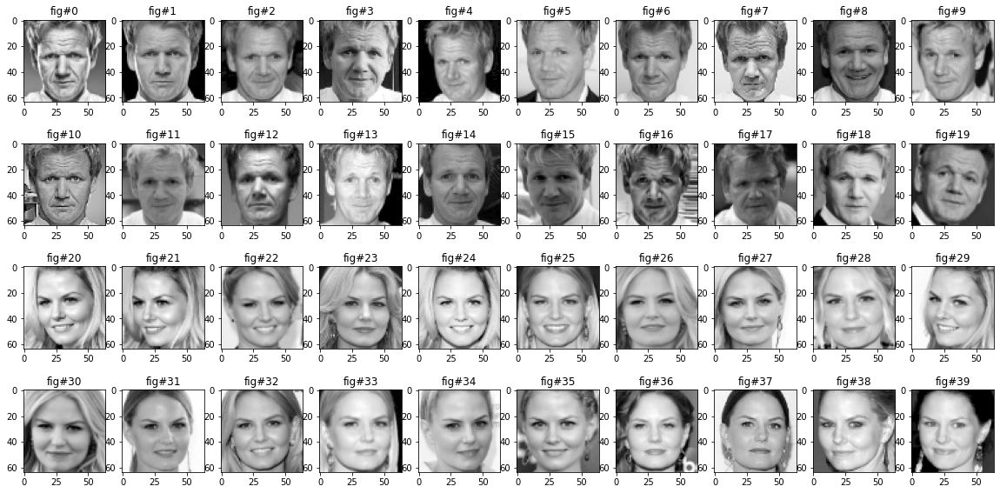

In [15]:
#show the images in a 4x5 grid
displayimages(faces)

#### Mean subtraction

Performing mean subtraction: The data needs to be centered, according to the math showed in the background theory section.

Let $X_{m,n}$ be the images matrix as defined before. 
Let $\hat{x}_i$ be the (row) vectors representing each image ($\hat{x}_i$ has thus 4096 coordinates).
Centering the data is achieved by imposing the mean to be equal to 0. 

$\frac{1}{m}\sum_{i=0}^{m-1} \hat{x}_i$

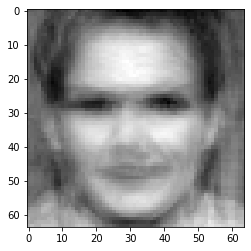

In [16]:
#returns a pandas series with key value = imgpath e value column (index=0) with the mean of
#the column 
faces_mean = faces.apply(lambda x: x.mean(), axis=0).astype(int)

#display the mean face
mean_face = np.reshape(np.array(faces_mean), (64,64))
plt.imshow(mean_face, cmap='gray')

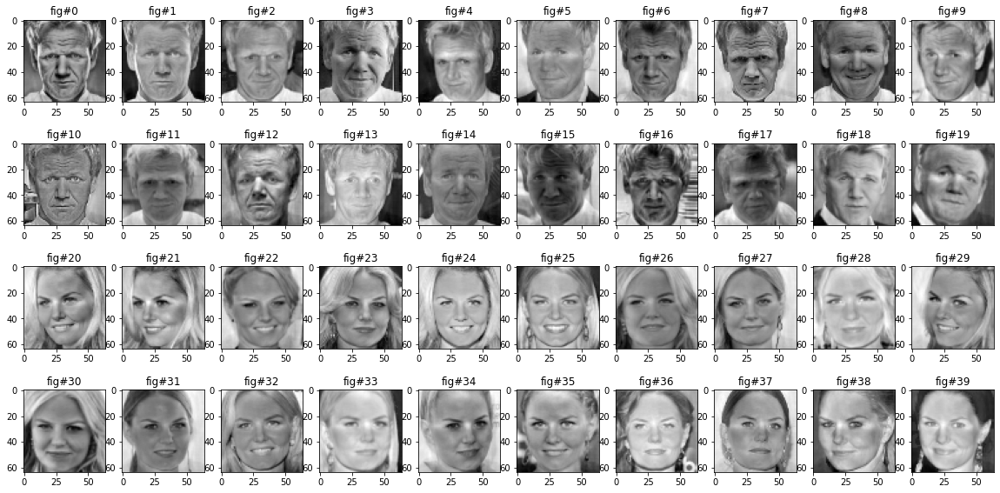

In [17]:
#returns a pandas dataframe with centered images (original images - the mean)
faces_centered = faces.subtract(faces_mean, axis = 1)

#show the centered images 
displayimages(faces_centered)

#### Compute SVD

Compute SVD and show principal components (eigenfaces)

X: (40, 4096)
U: (40, 40)
Sigma: (40,)
V^T: (40, 4096)
<class 'numpy.ndarray'>


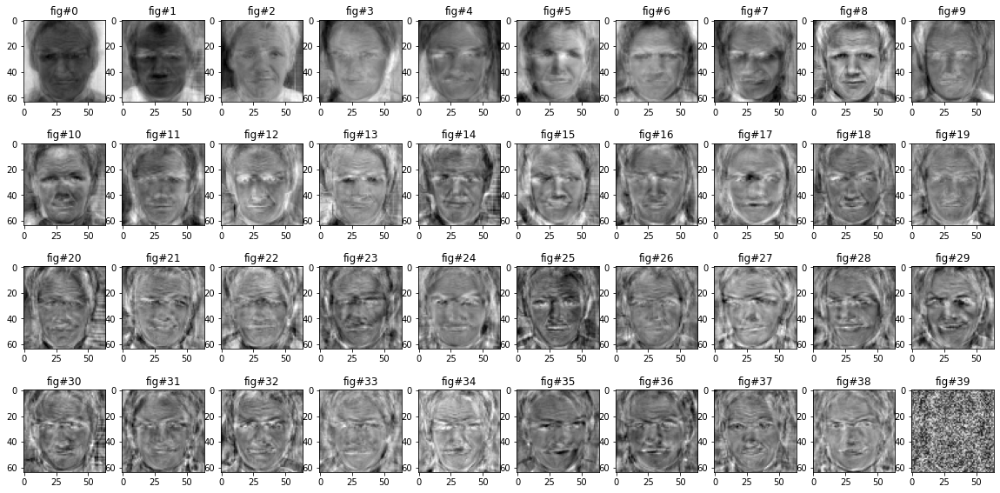

In [18]:
U, Sigma, VT = np.linalg.svd(faces_centered, full_matrices=False)

# Sanity check on dimensions
print("X:", faces_centered.shape)
print("U:", U.shape)
print("Sigma:", Sigma.shape)
print("V^T:", VT.shape)
print(type(VT))

#put the principal components (eigenfaces in a dataframe) and display the result
principal_components = pd.DataFrame(VT)
displayimages(principal_components)

#### Calculate weights

At this stage, we calculate the weights of our training images. We do so by projecting the images onto the principal components. Weights represents scalars for each image and for each principal component. Every image can be expressed as a linear combination of all the eigenfaces.


In [19]:
#calculate weights of the eigenfaces 
weights = faces_centered.dot(principal_components.transpose())
print('weights:', weights.shape)

weights: (40, 40)


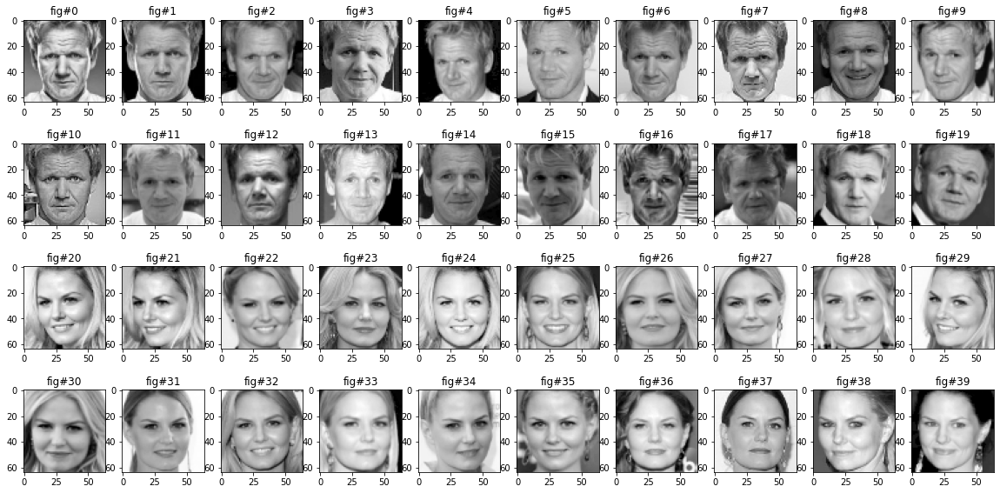

In [20]:
# reconstruct initial images as a linear combination of the 20 eigenfaces with associated weights
reconstructed_faces = weights.dot(principal_components)
# add back the mean
reconstructed_faces = reconstructed_faces.add(faces_mean, axis = 1)

#check 
displayimages(reconstructed_faces)

#### Calculate each face with few eigenfaces

Now we can show each face as the linear combination of just some weights with the associated eigenfaces. We will visualize how many eigenfaces + weights we need to keep in order to have a sufficiently good representation of the selected face.




##### Selecting the right number of eigenfaces

PCA allows us to select a $k < m$ number of principal components to represent the faces. $k$ can be found on a rigorous way understanding how many components explain a good amount of total variance of the data. However, that step would require calculating the covariance matrix. We decided to avoid that step and use SVD instead due to the fact that manipulating such big matrixes can be computationally expensive. We thus use an empirical method to find an optimal $k$ by trial and error.

In [0]:
# select a k number of principal components and project a set of faces on those components. Reconstruct original images as a linear combination
# of principal components 

def eigenface_redu(centeredfaces_df, facesmean_sr, eigenfaces_df, k):
  
  #coordinates coincide with weights
  reduced_eigenfaces = eigenfaces_df.head(k)
  coordinates = pd.DataFrame(centeredfaces_df.dot(reduced_eigenfaces.transpose()))
  
  reconstructed_imgs = coordinates.dot(reduced_eigenfaces)
  reconstructed_imgs = reconstructed_imgs.add(facesmean_sr, axis = 1)

  return coordinates, reconstructed_imgs

For $k=5:$

weights_reduced: (40, 5)
prova: (40, 4096)


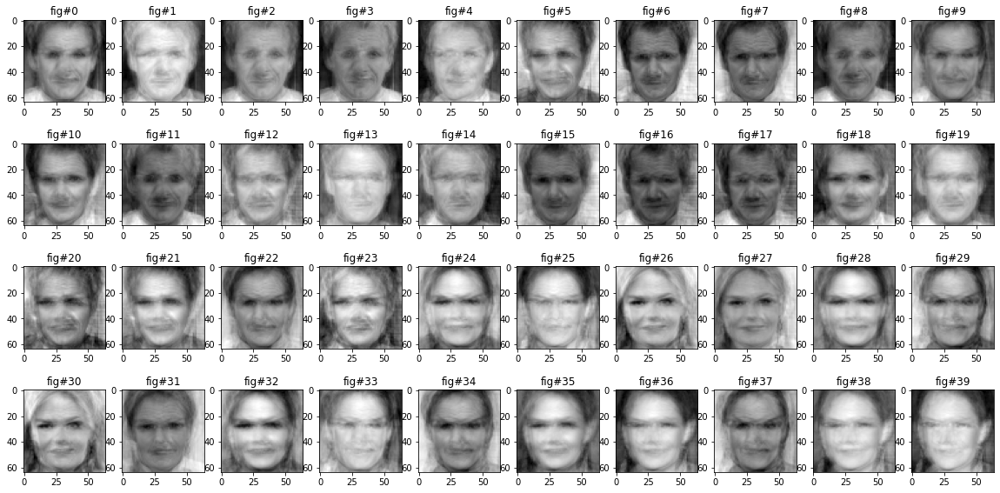

In [22]:
weights_reduced, prova = eigenface_redu(faces_centered, faces_mean, principal_components, 5)

print('weights_reduced:', weights_reduced.shape)
print('prova:',prova.shape)
displayimages(prova)

For $k=10$:

weights_reduced: (40, 10)
prova: (40, 4096)


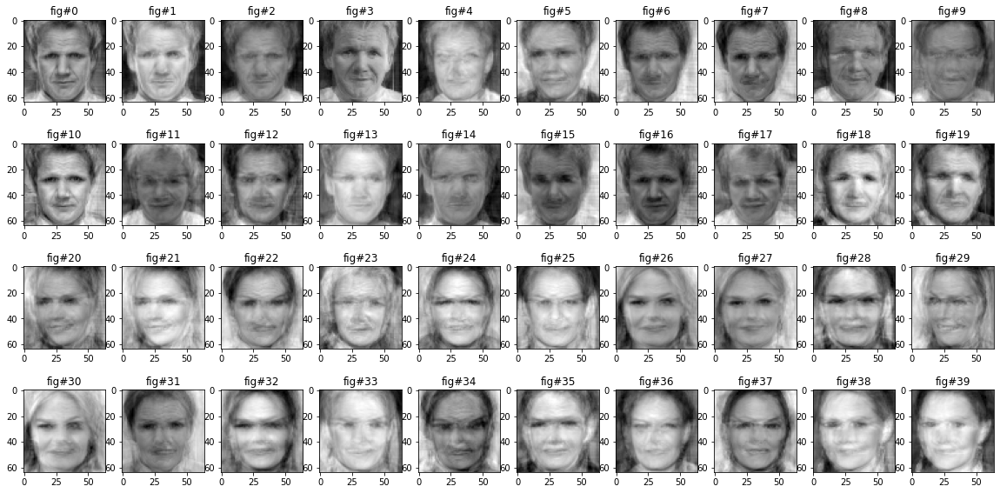

In [23]:
weights_reduced, prova = eigenface_redu(faces_centered, faces_mean, principal_components, 10)

print('weights_reduced:', weights_reduced.shape)
print('prova:',prova.shape)
displayimages(prova)

For $k=19$:

weights_reduced: (40, 19)
prova: (40, 4096)


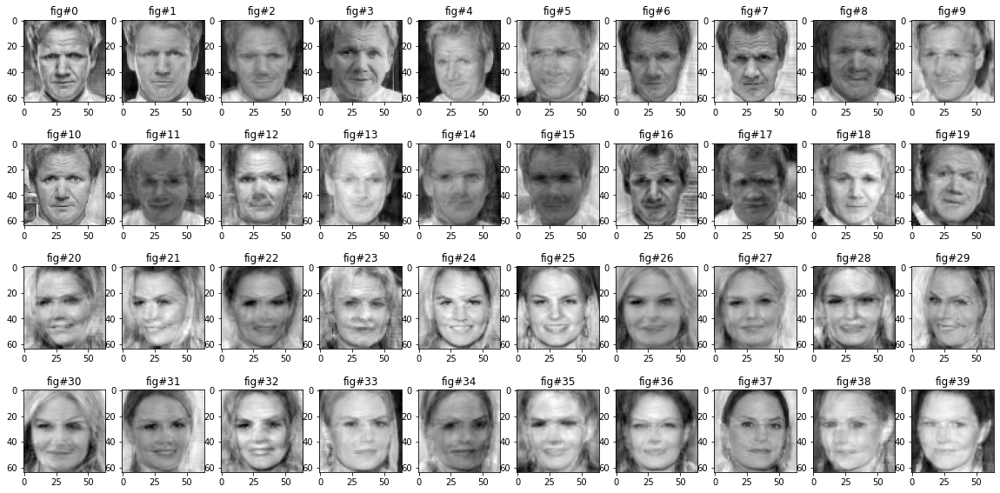

In [24]:
weights_reduced, prova = eigenface_redu(faces_centered, faces_mean, principal_components, 19)

print('weights_reduced:', weights_reduced.shape)
print('prova:',prova.shape)
displayimages(prova)

Visualizing the images using a reconstruction from 19 eigenfaces seems to bring satisfactory results, so we are going to stop here.


#### Project the test images onto the k-components

Project the test images onto the same k-components and visualize the new faces.

In [0]:
base_url_A_test = 'https://github.com/Nicocro/CV_Assignments/blob/master/Dataset_Faces/A_test/'
base_url_B_test = 'https://github.com/Nicocro/CV_Assignments/blob/master/Dataset_Faces/B_test/'

test_faces = pd.DataFrame([])

for i in range(10):
  test_img = url_to_image(base_url_A_test + 'A_test_GR_' + str(i) + '.png?raw=true')
  test_face = pd.Series(test_img.flatten(),name = 'A_test/A_test_GR_'+ str(i) + '.png')
  test_faces = test_faces.append(test_face).astype(int)

for i in range(10):
  test_img = url_to_image(base_url_B_test + 'B_test_JM_' + str(i) + '.png?raw=true')
  test_face = pd.Series(test_img.flatten(),name = 'B_test/B_test_JM_'+ str(i) +'.png')
  test_faces = test_faces.append(test_face).astype(int)

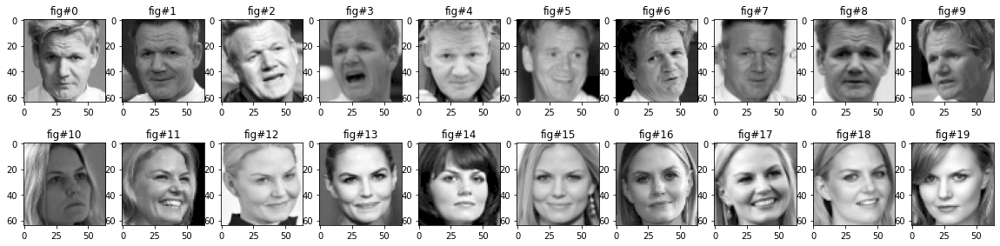

In [26]:
displayimages(test_faces)

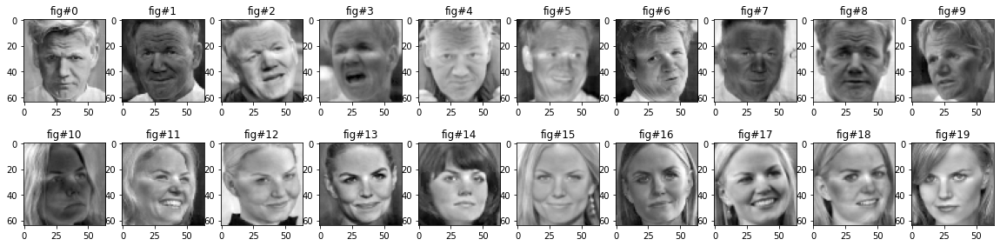

In [27]:
#subtract the mean from the test faces
test_faces_centered = test_faces.subtract(faces_mean, axis = 1)

#show the centered images 
displayimages(test_faces_centered)

Describe the test faces as a linear combination of the eigenfaces

In [28]:
test_weights, test_eigencombi = eigenface_redu(test_faces_centered, faces_mean, principal_components,19)

print('prova:', test_eigencombi.shape)
print('weights:', test_weights.shape)

prova: (20, 4096)
weights: (20, 19)


#### The Face-feature plot

Let's plot the test faces for subject A and B on the 2 prinncipal compontens

In [0]:
wtest2 = pd.DataFrame(test_weights.iloc[:,:2])

In [30]:
from bokeh.plotting import figure, show, output_file
from bokeh.io import show, output_notebook
from bokeh.models import ColumnDataSource, Grid, ImageURL, LinearAxis, Plot, Range1d

# Create a blank figure with labels
p = figure(plot_width = 600, plot_height = 600, 
           title = 'Test faces plotted along the first 2 principal components',
           x_axis_label = 'Eigenface1', y_axis_label = 'Eignface2', x_range=(-4000,4000), y_range=(-4000,4000))

for i, rows in wtest2.iterrows():
    imgurl = 'https://github.com/Nicocro/CV_Assignments/blob/master/Dataset_Faces/' + rows.name + '?raw=true'
    
    p.image_url(url=[imgurl], x=wtest2.loc[rows.name,0],y=wtest2.loc[rows.name,1],w=500, h=500, anchor='center')
  
output_notebook()
# Show the plot
show(p)

From the plot, we can see how illumination is probably captured as one of the main "features". It is clear that illumination levels variations is encoded along thee 2 first principal components


#### Reflections on PCA

* Reflect on the design choices that you made and how this might influence
the performance of the features that you have learned. 

* Did you need special pre-processing to make this work (which one and why)?

A fundamental step of pre-processing was required to apply PCA successfully. Centering the faces and using images of the same size. PCA aims to find the directions of maximum variance of the data, and in this case this objective can be achieved only if we have each specific pixel representing almost the same piece of face across the dataset of faces. 

Illumination variation is captured along the first two principal components. It is important then to build a dataset with big variation of illumination for the same face. If we have faces of one subject just with high illumination levels in oour training seet, for example, during classificatioon phase the results would be biased as a test face with high illumination would probably result similar to the training face just because of illumination.

Finally, for computational efficiency, it is important to limit the size of the images to a manageable # of pixels. Selecting the minimim value of k # of principal components is also a wise choice to make since PCA is all about efficiently representing a dataset with the lower (but meaningful) number of variables


### 4.2.2 Transfer Learning



Transfer Learning is defined as a situation where what has been learned in one setting is exploited to improve generalization in another setting. 

Transfer learning is used to accelerate the training of neural networks in the following scenarios, both of which find great application in the given problems of Feature representations and Facial Classification &/ Identification.

1. Layers in the base model can be used as a starting point for the training process of the new model. This is especially useful when the base model is trained on huge labelled data and computation power and finds a similarity in the structure with the newer problem.

2. In every large-scale pre-trained networks (here, base networks), the initial layers are dedicated to extraction of features. This means that the lower level layers learn low level features, such as edges, corners, shapes. Instead of re-using all layers of the base network, only those layers that facilitate feature extraction are retained and new layers are added to them inorder to learn the high level features specific to the new problem.

**Goal** : To leverage the face-features from
a pre-trained Convolutional Neural Network.

**Tasks**: 
1. To use the built-in **keras-vggface** package. It is the Oxford VGGFace Implementation using Keras Functional Framework. It includes models that are converted from original caffee networks.
2. To understand the architecture of the VGG Face Descriptor.
3. To preprocess the input data
3. To run the network on images from the training set (comprising of subject A and subject B) and generate facial features from the convolutional layers of the network
4. To visualise the features in a TSNE plot

The following are the necessary steps to extract features using a pretrained VGGFace model :


#### Download the keras-vggface repository
Tensorflow version supported by keras-vggface module is Tensorflow 1.x. Therefore, our program maintains consistency with the TF version and isn't implemented using Colab's default TF 2.0 installation

In [31]:
 %tensorflow_version 1.x
!pip install git+https://github.com/rcmalli/keras-vggface.git
!pip install keras_vggface
!pip show keras-vggface
# check version of keras_vggface
import keras_vggface
# print version
print(keras_vggface.__version__)

TensorFlow is already loaded. Please restart the runtime to change versions.
  Cloning https://github.com/rcmalli/keras-vggface.git to /tmp/pip-req-build-7gsty4tu
  Running command git clone -q https://github.com/rcmalli/keras-vggface.git /tmp/pip-req-build-7gsty4tu
  Created wheel for keras-vggface: filename=keras_vggface-0.6-cp36-none-any.whl size=8311 sha256=b06d2ecea08d5d6be5a701f41a56e5e9009b17dde682f4818cedc4349b510ec5
  Stored in directory: /tmp/pip-ephem-wheel-cache-jni10251/wheels/36/07/46/06c25ce8e9cd396dabe151ea1d8a2bc28dafcb11321c1f3a6d
Successfully built keras-vggface
Name: keras-vggface
Version: 0.6
Summary: VGGFace implementation with Keras framework
Home-page: https://github.com/rcmalli/keras-vggface
Author: Refik Can MALLI
Author-email: mallir@itu.edu.tr
License: MIT
Location: /usr/local/lib/python3.6/dist-packages
Requires: numpy, scipy, h5py, keras, pillow, six, pyyaml
Required-by: 
0.6


Using TensorFlow backend.


#### Installation of additional packages / modules

In [32]:
import tensorflow as tf

import pandas as pd
import numpy as np


from keras_vggface.utils import preprocess_input
from keras_vggface.utils import decode_predictions
from keras_vggface.vggface import VGGFace
from keras.preprocessing.image import load_img,img_to_array
from keras.applications.imagenet_utils import preprocess_input
from sklearn.preprocessing import LabelEncoder
from keras.models import Model
from keras.layers import Input, Flatten, Dense
from sklearn.model_selection import cross_validate
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.svm import SVC, LinearSVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from keras.optimizers import adam

import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.manifold import TSNE
import seaborn as sns
sns.set(rc={'figure.figsize':(10,10)})
palette = sns.color_palette("bright", 10)

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


#### VGGFace model and its architecture

The VGGFace network is made up of low level layers comprising Convolutional and Max Pooling layers. These layers help in extraction of facial features which are then passed to high level layers like Fully connected layers and Dense layers which help in extracting specific features of the subjects. The network takes 224*224 size colour images and output an n-dimensional array comprising facial features information at every subsequent layers in the network. An n-dimensional array is later flattened to reduce its dimensionality to adhere to specific tasks like Classification and Recognition. We will elaborate on these tasks as we proceed ahead.



The VGGFace network architecture can be best understood from the images below. These images are taken from University of Oxford's Deep Face Recognition project.

![VGGFace Architecture- Sequence of layers](https://i2.wp.com/sefiks.com/wp-content/uploads/2018/08/vgg-face-model.png?ssl=1)

![VGGFace Architecture - Dimesions of each layer outputs](https://i1.wp.com/sefiks.com/wp-content/uploads/2019/04/vgg-face-architecture.jpg?ssl=1)



For the task of understanding Feature Representations, we extract the Convolutional features for 40 training images from the network's last Max Pooling layer with dimensions (number_of_images,7,7,512). For this, we download the pre-trained VGGFace model without including the top layers ( top layers include the Fully Connected and Softmax layers). We add the argument "include_top= False" in the VGGFace model import method. 


The summary of the network architecture can also be found using Keras' prebuilt summary() call. The last MaxPooling layer named "pool5" has dimensions     (_, 7, 7, 512)      

In [33]:
vggface = VGGFace(model='vgg16',input_shape=(224, 224, 3), include_top=False)
vggface.summary()

58916864/58909280 [==============================] - 1s 0us/step
Model: "vggface_vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
conv1_1 (Conv2D)             (None, 224, 224, 64)      1792      
_________________________________________________________________
conv1_2 (Conv2D)             (None, 224, 224, 64)      36928     
_________________________________________________________________
pool1 (MaxPooling2D)         (None, 112, 112, 64)      0         
_________________________________________________________________
conv2_1 (Conv2D)             (None, 112, 112, 128)     73856     
_________________________________________________________________
conv2_2 (Conv2D)             (None, 112, 112, 128)     147584    
______________________________________________________

#### Data Pre- processing and Computation of facial encodings 

For this task, we use a combination of Open CV's and Keras' prebuilt functions. The inputs are images of shape 224*224 and outputs are appended in the parent data dictionary.

As mentioned earlier, subsequent preprocessing steps required for the Feature extraction task using VGGFace model are carried forward from Step 1.4.

**Preprocessing** :The VGGFace model has specific data requirements. The preprocessing steps adhering to the model are- 
1. Resizing extracted face crops to 224×224 pixels using OpenCV's resize function
2. Expanding dimensionality of the input array to accomodate all training images using numpy's expand_dims function
3. Mean subtraction of RGB channels from all input images. This step prepares subject's faces for the model by normalizing pixels between -1 to +1 using Keras' preprocess_input function.


Finally Facial encodings are predicted using the convolutional layers of the pretrained model.

In [0]:
def computeTLencodings():
  for celeb in subj_dict:
    subj_dict[celeb]["fvectors_vggface"] = []
    subj_dict[celeb]["fvectors_vggface_test"] = []
    for img in subj_dict[celeb]["images"]:
      img = cv2.resize(img,(224,224))
      img_data = np.expand_dims(img, axis=0)
      img_data = preprocess_input(img_data)
      # perform prediction of facial encodings
      vggface_feature = vggface.predict(img_data)
      vggface_feature_np = np.array(vggface_feature)
      subj_dict[celeb]["fvectors_vggface"].append(vggface_feature_np.flatten())

    if("images_test" in subj_dict[celeb]):
      for img in subj_dict[celeb]["images_test"]:
        img = cv2.resize(img,(224,224))
        img_data = np.expand_dims(img, axis=0)
        img_data = preprocess_input(img_data)
        # perform prediction of facial encodings
        vggface_feature = vggface.predict(img_data)
        vggface_feature_np = np.array(vggface_feature)
        subj_dict[celeb]["fvectors_vggface_test"].append(vggface_feature_np.flatten())

computeTLencodings()


In [0]:
fvectors_vggface_A = subj_dict["SubjectA_GR"]["fvectors_vggface"]
fvectors_vggface_B = subj_dict["SubjectB_JM"]["fvectors_vggface"]
fvectors_vggface_A_test = subj_dict["SubjectA_GR"]["fvectors_vggface_test"]
fvectors_vggface_B_test = subj_dict["SubjectB_JM"]["fvectors_vggface_test"]
fvectors_vggface_C = subj_dict["SubjectC_HL"]["fvectors_vggface"]
fvectors_vggface_D = subj_dict["SubjectD_MR"]["fvectors_vggface"]

# Training data: constructed by concatenating features and labels of subjects A and B. 
# Labels are categorical taking values 0 and 1, where 0: subject A and 1: subject B.
X = np.concatenate((fvectors_vggface_A, fvectors_vggface_B))
y = np.concatenate((np.zeros(len(fvectors_vggface_A)), np.ones(len(fvectors_vggface_B))))

# Similar to the training data, an in-space validation dataset comprising of 10 images each of subjects A and B is constructed. 
# Labels are prepared similar as above.
X_test = np.concatenate((fvectors_vggface_A_test, fvectors_vggface_B_test), axis=0)
y_test = np.concatenate((np.zeros(len(fvectors_vggface_A_test)), np.ones(len(fvectors_vggface_B_test))))


#### Visualisation of face encodings: The TSNE plot

t-distributed Stochastic Neighbor Embedding is a tool for visualising high-dimesional data. It converts similarities between data points to joint probabilities and tries to minimize the Kullback-Leibler divergence between the joint probabilities of the low-dimensional embedding and the high-dimensional data. 

Training data is first fit into an embedded space using the TSNE module of sklearn. The data can be viewed in different settings of the input space dimensions. The default dimesion is 2. **Learning rate and Number of iterations** of the method were maintained at their default values as changing them did not make significant changes to the resultant plots generated at the end of this task for any given values of Perplexity.

Another important factor that can be finetuned is **Perplexity**. It is described as a guess about the number of close neighbors each point has. Typically, perplexity values are in the range of 5 to 50. 

Next step after fitting the training data into the embedded space using different values of Perplexity was- to retrieve the transformed output. This was achieved by the fit_transform function on the fitted data.

Lastly, the tsne plot was generated using seaborn package.

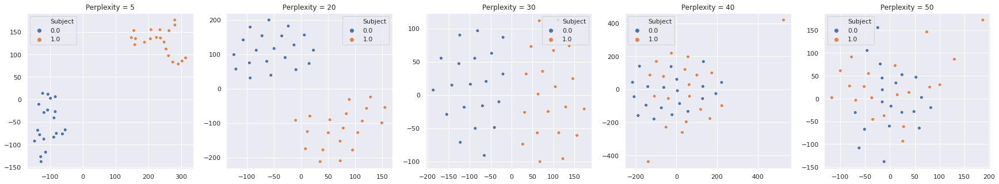

In [36]:
# creating a pandas dataframe for handling the expected datastructure more efficiently
X = list(X)
y = list(y)
df = pd.DataFrame({'Embeddings': X, 'Subject': y})
df['Subject'] = df['Subject'].astype('category')


sns.set(rc={'figure.figsize':(30,5)})
# palette = sns.color_palette("bright", 10)


# creating a tsne-plots for different values of perplexity

fig, axs = plt.subplots(1,5)

X_embedded1 = TSNE(n_components=2, perplexity= 5, n_iter=1000, learning_rate=200).fit_transform(X)
sns.scatterplot(X_embedded1[:,0], X_embedded1[:,1],legend='full', hue=df['Subject'], ax=axs[0]).set_title('Perplexity = 5')

X_embedded2 = TSNE(n_components=2, perplexity= 20, n_iter=1000, learning_rate=200).fit_transform(X)
sns.scatterplot(X_embedded2[:,0], X_embedded2[:,1],legend='full', hue=df['Subject'], ax=axs[1]).set_title('Perplexity = 20')

X_embedded3 = TSNE(n_components=2, perplexity= 30, n_iter=1000, learning_rate=200).fit_transform(X)
sns.scatterplot(X_embedded3[:,0], X_embedded3[:,1],legend='full', hue=df['Subject'],ax=axs[2]).set_title('Perplexity = 30')

X_embedded4 = TSNE(n_components=2, perplexity= 40, n_iter=1000, learning_rate=200).fit_transform(X)
sns.scatterplot(X_embedded4[:,0], X_embedded4[:,1],legend='full', hue=df['Subject'],ax=axs[3]).set_title('Perplexity = 40')

X_embedded5 = TSNE(n_components=2, perplexity= 50, n_iter=1000, learning_rate=200).fit_transform(X)
sns.scatterplot(X_embedded5[:,0], X_embedded5[:,1],legend='full', hue=df['Subject'],ax=axs[4]).set_title('Perplexity = 50')

plt.show()

TSNE expands dense clusters and contracts sparse clusters. It adapts its notion of “distance” to regional density variations in the data set and evens the data out. Though perplexity plots of values 20 and 30 show reasonably denser clusters, the clusters with perplexity = 30 show more stable regional density than the others.


# 5. Exploit feature representations

## 5.1 Classification



### 5.1.1 Histogram of Oriented Gradients

We can use the feature vectors computed by HOG to classify new images using any classification method. The original paper explaining HOG uses Support Vector Machines for this purpose, so we will be using them too.

First off we will be constructing a binary classifier for subjects A and B (Gordon Ramsay vs Jennifer Morrison). Concretely, we will be using the 20 training images for every subject resulting in an equally divided training set of 40 training images in total. For subject A, we will be assigning class 0. Subject B will be assigned class 1. We will be using 10 test images for every subject to check the accuracy of the classifier. The cell below initializes these vectors.

In [0]:
if len(subj_dict["SubjectA_GR"]["fvectors_hog"]) is not 20:
  print("Please run the cells for the HOG descriptor first !")
  raise RuntimeError()

fvectors_A = subj_dict["SubjectA_GR"]["fvectors_hog"]
fvectors_B = subj_dict["SubjectB_JM"]["fvectors_hog"]
fvectors_A_test = subj_dict["SubjectA_GR"]["fvectors_hog_test"]
fvectors_B_test = subj_dict["SubjectB_JM"]["fvectors_hog_test"]

X = np.concatenate((fvectors_A, fvectors_B), axis=0)
y = np.concatenate((np.zeros(len(fvectors_A)), np.ones(len(fvectors_B))))
X_test = np.concatenate((fvectors_A_test, fvectors_B_test), axis=0)
y_test = np.concatenate((np.zeros(len(fvectors_A_test)), np.ones(len(fvectors_B_test))))


We will be using the SVM implementation from sklearn. First we fit the training data, then we check its performance using the test set.

In [38]:
from sklearn import svm

clf_hog = svm.SVC()
clf_hog.fit(X, y)

Y_pred = clf_hog.predict(X_test)
print("Accuracy of the model for classifying A/B: {}%".format(100 * np.sum(Y_pred == y_test) / len(Y_pred)))

Accuracy of the model for classifying A/B: 100.0%


As we can see from the accuracy, every test image was predicted correctly. This is most likely explained due to the centralization of the images prior to applying the HOG algorithm. Due to this, the general shape of a person's face stays somewhat consistent throughout every image of that person. This results in similar gradients and thus similar feature vectors.



Next, we can try to classify subject C and subject D (Hugh Laurie vs Margot Robbie) using this model. Obviously, this classifier will predict them as either subject A or subject B. Remember though that subjects C and D were chosen to be somewhat similar to subjects A and B respectively. Due to this, we can test how robust this algorithm is for classifying similar people. We will assign class 0 to subject C and class 1 to subject D. 

In [39]:
fvectors_C = subj_dict["SubjectC_HL"]["fvectors_hog"]
fvectors_D = subj_dict["SubjectD_MR"]["fvectors_hog"]

X_test_CD = np.concatenate((fvectors_C, fvectors_D))
y_test_CD = np.concatenate((np.zeros(len(fvectors_C)), np.ones(len(fvectors_D))))

Y_pred_CD = clf_hog.predict(X_test_CD)
print("Accuracy of the model for classifying C/D using the A/B model: {}%".format(100 * np.sum(Y_pred_CD == y_test_CD) / len(Y_pred_CD)))

Accuracy of the model for classifying C/D using the A/B model: 100.0%


This shows that our algorithm is capable of recognizing similar people with high accuracy. These results should be taken lightly though, as only a total of 20 images were used for testing.

### 5.1.2 PCA


First, we fetch the test images that we are going to use to test the classification accuracy, and transform them into a Pandas dataframe:

In [40]:
# build the dataframe for test images

base_url_C = 'https://github.com/Nicocro/CV_Assignments/blob/master/Dataset_Faces/SubjectC_HL/'
base_url_D = 'https://github.com/Nicocro/CV_Assignments/blob/master/Dataset_Faces/SubjectD_MR/'

c_faces = pd.DataFrame([])

for i in range(10):
  c_img = url_to_image(base_url_C + 'HL_' + str(i) + '.png?raw=true')
  c_face = pd.Series(c_img.flatten(),name = 'HL_'+ str(i) + '.png')
  c_faces = c_faces.append(c_face).astype(int)

d_faces = pd.DataFrame([])

for i in range(10):
  d_img = url_to_image(base_url_D + 'MR_' + str(i) + '.png?raw=true')
  d_face = pd.Series(d_img.flatten(),name = 'MR_'+ str(i) + '.png')
  d_faces = d_faces.append(d_face).astype(int)

total_test_faces = c_faces.append(d_faces)

# show dataframe
print(total_test_faces)

          0     1     2     3     4     ...  4091  4092  4093  4094  4095
HL_0.png   243   244   244   244   244  ...    56    53    54    58    58
HL_1.png   201   202   202   202   202  ...    39    28    28    28    28
HL_2.png   125   126   126   125   125  ...     0    21    21    21    21
HL_3.png    43    43    43    43    46  ...   106   102    98    93    89
HL_4.png   246   246   245   247   248  ...    28    28    28    28    28
HL_5.png   107   106   107   107   107  ...     0     0     0     0    46
HL_6.png   213   213   213   214   214  ...    74    74    72    80   105
HL_7.png    21    21    21    21    21  ...    28    34    34    39    39
HL_8.png   134   134   135   133   131  ...   236   251   251   242   213
HL_9.png    61    59    61    61    61  ...   158   169   175   170   166
MR_0.png   192   192   191   190   190  ...   120   120   116    96    89
MR_1.png   212   211   210   218   209  ...   185   200   190   161   160
MR_2.png   246   240   239   215   195

We then fit the PCA model with the training data. For this, we will use the PCA function available in the sklearn library.

In [41]:
from sklearn import decomposition

# transform Pandas dataframes to numpy arrays
X_train = faces.to_numpy()
X_test = total_test_faces.to_numpy()

# fit the model
pca = decomposition.PCA()
pca.fit(X_train)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

We can now use the PCA decomposed data to train a model that will be in charge of classifying the test data. In this case, we chose an SVM.

In [42]:
from sklearn import svm

X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

y_train = np.concatenate((np.zeros(20), np.ones(20)))
y_test =  np.concatenate((np.zeros(10), np.ones(10)))

clf = svm.SVC()
clf.fit(X_train_pca, y_train)

SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)

Once the model is trained, we use it to predict the class of the new data.

We then show the results of the classification on a grid.

Model has an accuracy of 80.0%


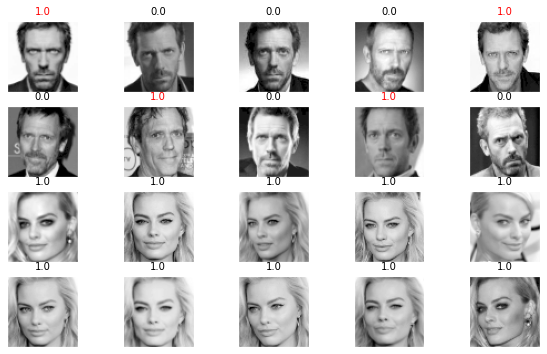

In [43]:

y_pred = clf.predict(X_test_pca)
acc = np.sum(y_pred == y_test) / len(y_pred)
print("Model has an accuracy of {}%".format(acc*100))

fig = plt.figure(figsize=(10,6))

for i in range(20):
    ax = fig.add_subplot(4, 5, i + 1, xticks=[], yticks=[])
    ax.imshow(X_test[i].reshape(64,64),
              cmap='gray')
    y_pred = clf.predict(X_test_pca[i, np.newaxis])[0]
    color = ('black' if y_pred == y_test[i] else 'red')
    ax.set_title(y_pred, fontsize='small', color=color)

We see how the mistakes are only referred to Hugh Laurie, while Margot Robbie is recognized 100% of the times as being similar to Jennifer Morrison. This is probably because the Margot's dataset contains faces that do not significantly vary in scale, pose and most of all illumination. MR faces are very similar to JM training set under these points of view. On the other hand, HL dataset contains very different backgrounds and illumination levels which are probably the main cause of classification errors. 


### 5.1.3 Transfer Learning

#### Approach 1: Support Vector Machines


We use SKLearn's SVM classifier on the extracted face encodings and fit the training data of subject A and B. The classifier predicts the output as class 0 (for Subject A) and class 1 (for Subject B).

We perform in-space Validation on the test data reserved for subjects A and B and compute the accuracy of the model.

Finally, we classify images of the test subjects C and D and generate classification outputs 0 (for subject C which is similar to subject A) and 1 (for subject D which is similar to subject B)

In [0]:
if "fvectors_vggface" not in subj_dict["SubjectA_GR"] or len(subj_dict["SubjectA_GR"]["fvectors_vggface"]) is not 20:
  print("Please run the cells for Transfer Learning first !")
  raise RuntimeError("Please run the cells for Transfer Learning first !")

fvectors_vggface_A = subj_dict["SubjectA_GR"]["fvectors_vggface"]
fvectors_vggface_B = subj_dict["SubjectB_JM"]["fvectors_vggface"]
fvectors_vggface_A_test = subj_dict["SubjectA_GR"]["fvectors_vggface_test"]
fvectors_vggface_B_test = subj_dict["SubjectB_JM"]["fvectors_vggface_test"]
fvectors_vggface_C = subj_dict["SubjectC_HL"]["fvectors_vggface"]
fvectors_vggface_D = subj_dict["SubjectD_MR"]["fvectors_vggface"]

X = np.concatenate((fvectors_vggface_A, fvectors_vggface_B))
y = np.concatenate((np.zeros(len(fvectors_vggface_A)), np.ones(len(fvectors_vggface_B))))

X_test = np.concatenate((fvectors_vggface_A_test, fvectors_vggface_B_test), axis=0)
y_test = np.concatenate((np.zeros(len(fvectors_vggface_A_test)), np.ones(len(fvectors_vggface_B_test))))

In [45]:
clf = LinearSVC(C=1.0, loss='squared_hinge', penalty='l2',multi_class='ovr')
clf.fit(X, y)
Y_pred = clf.predict(X_test)
print(y_test,Y_pred)
print("Accuracy of the model for classifying A/B: {}%".format(100 * np.sum(Y_pred == y_test) / len(Y_pred)))

X_test_CD = np.concatenate((fvectors_vggface_C, fvectors_vggface_D))
y_test_CD = np.concatenate((np.zeros(len(fvectors_vggface_C)), np.ones(len(fvectors_vggface_D))))

Y_pred_CD = clf.predict(X_test_CD)
print("Accuracy of the model for classifying C/D using the A/B model: {}%".format(100 * np.sum(Y_pred_CD == y_test_CD) / len(Y_pred_CD)))

[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1.]
Accuracy of the model for classifying A/B: 100.0%
Accuracy of the model for classifying C/D using the A/B model: 100.0%


Confusion matrix of Classification accuracies of test subjects A and B
[[10  0]
 [ 0 10]]


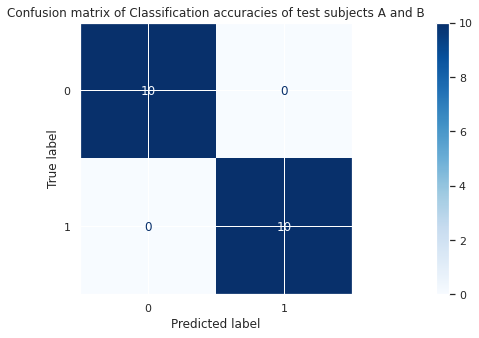

In [46]:
classifier = SVC(kernel='linear', C=0.01)
train = classifier.fit(X, y)
np.set_printoptions(precision=2)
class_names = [0,1]
# Plot non-normalized confusion matrix
titles_options = [("Confusion matrix of Classification accuracies of test subjects A and B", None)]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(train, X_test, Y_pred,
                                 display_labels=class_names,
                                 cmap=plt.cm.Blues)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

Confusion matrix of classification accuracies of test subjects C and D
[[10  0]
 [ 0 10]]


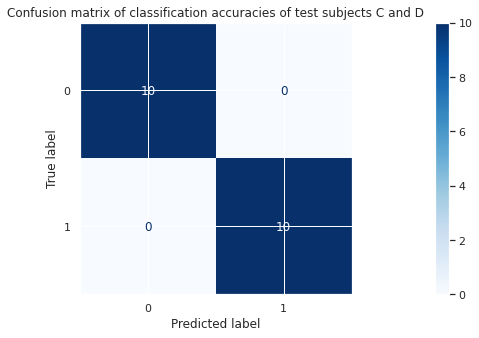

In [47]:
classifier = SVC(kernel='linear', C=0.01)
train = classifier.fit(X, y)
np.set_printoptions(precision=2)
class_names = [0,1]
# Plot non-normalized confusion matrix
titles_options = [("Confusion matrix of classification accuracies of test subjects C and D", None)]
for title, normalize in titles_options:
    disp = plot_confusion_matrix(train, X_test_CD, Y_pred_CD,
                                 display_labels=class_names,
                                 cmap=plt.cm.Blues)
    disp.ax_.set_title(title)

    print(title)
    print(disp.confusion_matrix)

plt.show()

#### Approach 2 : TL training softmax

Another approach of building a classifier on top of a convolutional feature-extractor base is utilising layers pertaining to classification tasks. These are stacks of Fully connected layers followed by a Softmax activation layer which outputs a probability distribution over each possible class label. 

Firstly, we define the new model. Additional layers are added. A Flatten layer first flattens the feature encodings generated from the pre-trained feature extractor model from Step 4.2.3. A softmax activation layer is then connected to the flatten layer. The number of classes is set as 2 ( for classifying subjects as A or B). 


The model is then compiled using Categorical Crossentropy loss (as we classify among multiple classes). We use the default optimizer and the metric of evaluation is set to "Accuracy" which outputs Training and Validation accuracies. The model is trained on the training dataset containing 40 faces (subjects A and B) and is validated on 20 faces (test set of A and B).

The held out dataset of 20 faces ( subject C and D) is used to perform predictions using the new model. 



In [0]:
for celeb in subj_dict:
  subj_dict[celeb]["img_data_vggface"] = []
  subj_dict[celeb]["img_data_vggface_test"] = []
  for img in subj_dict[celeb]["images"]:
    img = cv2.resize(img,(224,224))
    img_data = np.expand_dims(img, axis=0)
    img_data = preprocess_input(img_data)
    subj_dict[celeb]["img_data_vggface"].append(img_data)

  if("images_test" in subj_dict[celeb]):
    for img in subj_dict[celeb]["images_test"]:
      img = cv2.resize(img,(224,224))
      img_data = np.expand_dims(img, axis=0)
      img_data = preprocess_input(img_data)
      subj_dict[celeb]["img_data_vggface_test"].append(img_data)


In [0]:
imgdata_vggface_A = subj_dict["SubjectA_GR"]["img_data_vggface"]
imgdata_vggface_B = subj_dict["SubjectB_JM"]["img_data_vggface"]
imgdata_vggface_A_test = subj_dict["SubjectA_GR"]["img_data_vggface_test"]
imgdata_vggface_B_test = subj_dict["SubjectB_JM"]["img_data_vggface_test"]
imgdata_vggface_C = subj_dict["SubjectC_HL"]["img_data_vggface"]
imgdata_vggface_D = subj_dict["SubjectD_MR"]["img_data_vggface"]


X_train = np.concatenate((imgdata_vggface_A, imgdata_vggface_B))
X = X_train[:, 0, :, :, :]
y = np.concatenate((np.zeros(len(imgdata_vggface_A)), np.ones(len(imgdata_vggface_B))))

X_test = np.concatenate((imgdata_vggface_A_test, imgdata_vggface_B_test))
X_test = X_test[:, 0, :, :, :]
y_test = np.concatenate((np.zeros(len(imgdata_vggface_A_test)), np.ones(len(imgdata_vggface_B_test))))

X_test_CD = np.concatenate((imgdata_vggface_C, imgdata_vggface_D))
X_test_CD = X_test_CD[:, 0, :, :, :]
y_test_CD = np.concatenate((np.zeros(len(imgdata_vggface_C)), np.ones(len(imgdata_vggface_D))))


In [0]:
# making labels as categorical
from keras.utils import to_categorical
y = to_categorical(y)
y_test = to_categorical(y_test)
Y_pred_CD = to_categorical(Y_pred_CD)

In [0]:
# making all layers in the base model as non-trainable
for layer in vggface.layers:
    layer.trainable = False

# specifying additional layers
# The dense layer: Flatten() accepts the output from the last layer of the base model as an input to the new model 
x = Flatten()(vggface.layers[-1].output)
# next, a dense layer with softmax activation is connected. number of classes is set as 2
x = Dense(2, activation = 'softmax',name='classification')(x)

# full model is now specified alongwith the pre-specified input and expected output 
model = Model(inputs = vggface.input, outputs = x)

# compiling model
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [52]:
# training the model for 5 epochs
history = model.fit(X,y,
          epochs=5, validation_data = (X_test,y_test))
print ('Training Accuracy for 5 epochs = ' + str(history.history['accuracy']))
print ('Validation Accuracy for 5 epochs = ' + str(history.history['val_accuracy']))

print('Validation Accuracy is around 90% in the first epoch and increases to 100% in the second epoch.')

Train on 40 samples, validate on 20 samples
Epoch 1/5
40/40 [==============================] - 31s 769ms/step - loss: 1.9672 - accuracy: 0.8750 - val_loss: 1.2275 - val_accuracy: 0.9000
Epoch 2/5
40/40 [==============================] - 30s 743ms/step - loss: 0.5492 - accuracy: 0.9500 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 3/5
40/40 [==============================] - 33s 826ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 4/5
40/40 [==============================] - 30s 745ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Epoch 5/5
40/40 [==============================] - 30s 744ms/step - loss: 0.0000e+00 - accuracy: 1.0000 - val_loss: 0.0000e+00 - val_accuracy: 1.0000
Training Accuracy for 5 epochs = [0.875, 0.95, 1.0, 1.0, 1.0]
Validation Accuracy for 5 epochs = [0.8999999761581421, 1.0, 1.0, 1.0, 1.0]
Validation Accuracy is around 95% in the first epoch and increases to 100% in th

Predicting the test subjects C and D if they are similar to subjects A and B respectively. The model trained on subjects A and B is used to evaluate the other two subjects. Prediction accuracy of a 100% is achieved in this step too.

In [53]:
y_pred = model.predict(X_test_CD)
y_test_CD = []
for i,ele in enumerate(y_test):
  y_test_CD.append(ele[1])

y_pred_CD = []
for i,ele in enumerate(y_test):
  y_pred_CD.append(ele[1])

print("Accuracy: {0:0.1f}%".format(accuracy_score(y_test_CD,y_pred_CD)*100))

Accuracy: 100.0%


## 5.2 Identification

The objective of this section is using KMeans to find the closest match for a given test image, that means finding the most similar image from the training set.

Using the features extracted from the training images, we can use KMeans and a similarity measure to find the closest match.



### 5.2.1 Histogram of Oriented Gradients

In the case of HOG, we first use KMeans to classify the data and check that the model was well fitted. Then, we proceed to calculate the distance of each point to the cluster centers.

We will use this measure as the similarity between two images, and compute the closest match.

First we load the data and fit the model:

In [0]:
from sklearn.cluster import KMeans

# Train data
fvectors_A = subj_dict["SubjectA_GR"]["fvectors_hog"]
fvectors_B = subj_dict["SubjectB_JM"]["fvectors_hog"]
# Test data
fvectors_A_test = subj_dict["SubjectA_GR"]["fvectors_hog_test"]
fvectors_B_test = subj_dict["SubjectB_JM"]["fvectors_hog_test"]
fvectors_C_test = subj_dict["SubjectC_HL"]["fvectors_hog"]
fvectors_D_test = subj_dict["SubjectD_MR"]["fvectors_hog"]

X = np.concatenate((fvectors_A, fvectors_B), axis=0)
X_testAB = np.concatenate((fvectors_A_test, fvectors_B_test), axis=0)
X_testCD = np.concatenate((fvectors_C_test, fvectors_D_test), axis=0)
X_testACBD = np.concatenate((fvectors_A_test, fvectors_C_test, fvectors_B_test, fvectors_D_test), axis=0)

# The labels are just used to compute accuracies, as KMeans is unsupervised learning
Y = np.concatenate((np.zeros(len(fvectors_A)), np.ones(len(fvectors_B))))
Y_testAB = np.concatenate((np.zeros(len(fvectors_A_test)), np.ones(len(fvectors_B_test))))
Y_testCD = np.concatenate((np.zeros(len(fvectors_C_test)), np.ones(len(fvectors_D_test))))
Y_testACBD = np.concatenate((np.zeros(len(fvectors_A_test) + len(fvectors_C_test)), np.ones(len(fvectors_B_test) + len(fvectors_D_test))))

# Fit KMeans model to predict data class
# n_clusters = 2, corresponding to subjects A and B
km = KMeans(
    n_clusters=2, init='random',
    n_init=10, max_iter=300, 
    tol=1e-04, random_state=0
)

We first use the fitted model for classification, just to prove the robustness of this technique:

In [55]:
# Use KMeans for classification
y_km = km.fit_predict(X)
print("Accuracy of the model on training data AB: {}%".format(100 * np.sum(y_km == Y) / len(y_km)))
print(Y.astype(int))
print(y_km)

y_testAB = km.predict(X_testAB)
print("Accuracy of the model on test data AB: {}%".format(100 * np.sum(y_testAB == Y_testAB) / len(y_testAB)))
print(Y_testAB.astype(int))
print(y_testAB)

y_testCD = km.predict(X_testCD)
print("Accuracy of the model on test data CD: {}%".format(100 * np.sum(y_testCD == Y_testCD) / len(y_testCD)))
print(Y_testCD.astype(int))
print(y_testCD)

y_testACBD = km.predict(X_testACBD)
print("Accuracy of the model on test data ACBD: {}%".format(100 * np.sum(y_testACBD == Y_testACBD) / len(y_testACBD)))
print(Y_testACBD.astype(int))
print(y_testACBD)

Accuracy of the model on training data AB: 100.0%
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1]
Accuracy of the model on test data AB: 95.0%
[0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1]
[0 0 0 0 0 0 0 0 0 0 1 1 0 1 1 1 1 1 1 1]
Accuracy of the model on test data CD: 100.0%
[0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1]
[0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1]
Accuracy of the model on test data ACBD: 97.5%
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1]



Then we use KMeans to find the closest match for every test image:


Most similar image for every test image(subjects A, B, C and D):
[[0, 17], [1, 12], [2, 19], [3, 19], [4, 18], [5, 19], [6, 19], [7, 9], [8, 9], [9, 19], [10, 4], [11, 4], [12, 4], [13, 19], [14, 4], [15, 19], [16, 19], [17, 17], [18, 9], [19, 19], [20, 30], [21, 34], [22, 19], [23, 34], [24, 34], [25, 33], [26, 22], [27, 30], [28, 30], [29, 38], [30, 38], [31, 29], [32, 34], [33, 34], [34, 34], [35, 29], [36, 39], [37, 21], [38, 37], [39, 34]]


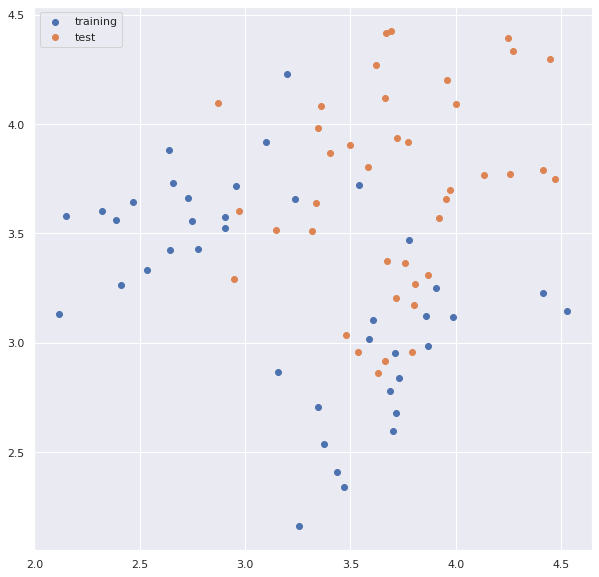

In [56]:
import matplotlib.pyplot as plt

# Use KMeans for identification(finding the most similar image to the images being tested)
y_transform = km.transform(X)
y_testACBD_transform = km.transform(X_testACBD)

# Show a scatter of the train and test distance points
plt.figure(figsize=(10,10))
plt.scatter(y_transform[:, 0], y_transform[:, 1], label='training')
plt.scatter(y_testACBD_transform[:, 0], y_testACBD_transform[:, 1], label='test')
plt.legend(loc='best')

def find_closest_point_pairs(Y, Y_test):
  closest_points = []
  # Find the closest point for every test image
  for i in range(len(Y_test)):
    min_distance = np.Infinity
    closest_point = 0
    for j in range(len(Y)):
      # Calculate distance between two points
      distance = np.sqrt(np.sum(np.power(Y[j] - Y_test[i], 2)))
      if(distance < min_distance):
        min_distance = distance
        closest_point = j

    closest_points.append([i, closest_point])
    
  print("Most similar image for every test image(subjects A, B, C and D):")
  print(closest_points)

  return closest_points

closest_points = find_closest_point_pairs(y_transform, y_testACBD_transform)

The plot above shows tha training and test data in the cluster space. We can see how the training data clearly forms two clusters, while the test data is a bit more diffuse.

Now that we have computed the image pairs, we can finally display them. The image on the left is the test image, and the image on the right is the closest match.

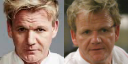

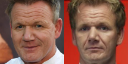

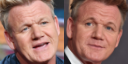

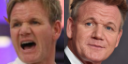

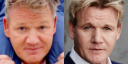

...

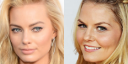

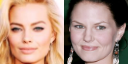

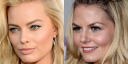

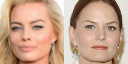

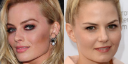

In [57]:
# Show image pairs
# Test:
# 0-9: A
# 10-19: C
# 20-29: B
# 30-39: D
# Match:
# 0-19: A
# 20-39: B
def show_identified_images(points):
  for point_pair in points:
    test_image_id = point_pair[0]
    match_image_id = point_pair[1]

    # Get corresponding test image
    if(test_image_id < 10):
      test_image = subj_dict["SubjectA_GR"]["images_test"][test_image_id]
    elif(test_image_id < 20):
      test_image = subj_dict["SubjectC_HL"]["images"][test_image_id-10]
    elif(test_image_id < 30):
      test_image = subj_dict["SubjectB_JM"]["images_test"][test_image_id-20]
    else:
      test_image = subj_dict["SubjectD_MR"]["images"][test_image_id-30]

    # Get most similar image
    if(match_image_id < 20):
      match_image = subj_dict["SubjectA_GR"]["images"][match_image_id]
    else:
      match_image = subj_dict["SubjectB_JM"]["images"][match_image_id-20]

    # Horizontally stack images
    match = np.hstack((test_image, match_image))
    cv2_imshow(match)

show_identified_images(closest_points)

As we can see, out identification algorithm based on the extracted features works pretty well. All test images of Gordom Ramsay and Hugh Larie are identified as Gordom Ramsay. And almost all the test images of Jennifer Morrison and Margot Robbie are identified as Jennifer Morrison.

There's only one image which has been incorrectly identified.

### 5.2.2 PCA

We want to show similarity across faces to identify them. The goal can be achieved by calculating the euclidean distance between the weights vectors of the set of training images and the weights vector of a test image. Minimizing such a distance means providing an identification of the face. 



In [0]:
base_url_C = 'https://github.com/Nicocro/CV_Assignments/blob/master/Dataset_Faces/SubjectC_HL/'
base_url_D = 'https://github.com/Nicocro/CV_Assignments/blob/master/Dataset_Faces/SubjectD_MR/'

c_faces = pd.DataFrame([])

for i in range(10):
  c_img = url_to_image(base_url_C + 'HL_' + str(i) + '.png?raw=true')
  c_face = pd.Series(c_img.flatten(),name = 'HL_'+ str(i) + '.png')
  c_faces = c_faces.append(c_face).astype(int)

d_faces = pd.DataFrame([])

for i in range(10):
  d_img = url_to_image(base_url_D + 'MR_' + str(i) + '.png?raw=true')
  d_face = pd.Series(d_img.flatten(),name = 'MR_'+ str(i) + '.png')
  d_faces = d_faces.append(d_face).astype(int)

Below we built a function that takes as an input three objects: A Pandas dataframe of the training images,  a pandas series of a test image,  and the number k of principal components we want to make use of. The function returns, after performing PCA , the most similar image of the training set compared to the test image passed as an argument.

Such a similarity calculation is performed by computing the distance between each weight vector of the training images and the weight vector of the test image. Such weights represent the scalars of the linear combination of such weights with the principal components of the training set, through which each image is described, including the test image. 

The _simil_ function basically summarizes all the steps taken in section 4.2.2 related to PCA plus it calculates the similarity

In [0]:
def simil(trainfaces_df, testface, k_components):

  # trainfaces_df is a pandas dataframe containing the trainiing faces: a matrix of m samples (faces) and n variables 
  # (pixels per face) TESTface is a pandas series, k_components is an integer

  #center train images
  train_faces_mean = trainfaces_df.apply(lambda x: x.mean(), axis=0).astype(int)
  train_faces_centered = trainfaces_df.subtract(faces_mean, axis = 1)
  #center test image
  centered_test_face = pd.DataFrame(testface.subtract(faces_mean))
  t_centered_test_face = centered_test_face.transpose()
  #find all the eigenfaces
  U_train, Sigma_train, VT_train = np.linalg.svd(train_faces_centered, full_matrices=False)
  eigenfaces_train = pd.DataFrame(VT_train)

  #find weight (coordinates) of the train images --> scalars to linearly combinate eigenfaces
  reduced_eigenfaces_train = eigenfaces_train.head(k_components)
  w_train_coordinates = pd.DataFrame(train_faces_centered.dot(reduced_eigenfaces_train.transpose()))
  
  #find weights (coordinates) of the test image --> scalars to linearly combinate train eigenfaces 
  w_test_coordinates = pd.DataFrame(t_centered_test_face.dot(reduced_eigenfaces_train.transpose()))

  #calculate euclidean distance between the test image weights and the train weights, the minimal the distance, the closest the image
  distances = pd.DataFrame(scipy.spatial.distance.cdist(w_test_coordinates.iloc[:,1:], w_train_coordinates.iloc[:,1:], metric='euclidean'))
  min_index = distances.idxmin(axis=1)

  #print(min_index)
  similar_face = trainfaces_df.iloc[min_index[0]]
  #similar_face = np.reshape(np.array(trainfaces_df.iloc[min_index[0]]), (64,64))
  #plt.imshow(similar_face, cmap='gray')

  return similar_face

The following code will display 2 rows of images. On the first row we will see the test image. In the second row the most similar face to the test image above.

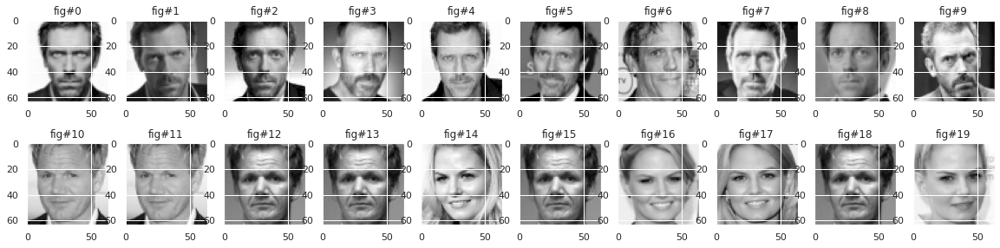

In [60]:
similar_to_HL = c_faces

for i in range(len(c_faces)):
  similar_to_HL = similar_to_HL.append(simil(faces, c_faces.iloc[i], 19))

displayimages(similar_to_HL)

We repeat the same process using the test images of Margot Robbie this time

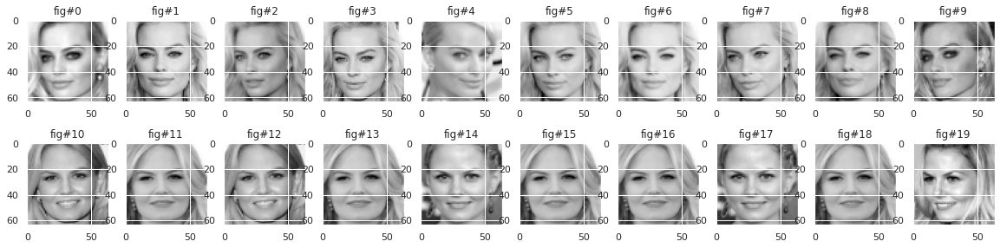

In [61]:
similar_to_MR = d_faces

for i in range(len(d_faces)):
  similar_to_MR = similar_to_MR.append(simil(faces, d_faces.iloc[i], 19))

displayimages(similar_to_MR)

### 5.2.3 Transfer Learning

In [0]:
computeTLencodings()

In [0]:
fvectors_vggface_A = subj_dict["SubjectA_GR"]["fvectors_vggface"]
fvectors_vggface_B = subj_dict["SubjectB_JM"]["fvectors_vggface"]
fvectors_vggface_A_test = subj_dict["SubjectA_GR"]["fvectors_vggface_test"]
fvectors_vggface_B_test = subj_dict["SubjectB_JM"]["fvectors_vggface_test"]
fvectors_vggface_C = subj_dict["SubjectC_HL"]["fvectors_vggface"]
fvectors_vggface_D = subj_dict["SubjectD_MR"]["fvectors_vggface"]

# making the Training dataset by concatenating features and labels of subjects A and B. The labels are categorical. 0: subject A and 1: subject B.
X = np.concatenate((fvectors_vggface_A, fvectors_vggface_B))
y = np.concatenate((np.zeros(len(fvectors_vggface_A)), np.ones(len(fvectors_vggface_B))))

# similar to training dataset, an in-space validation dataset comprising 10 images of subjects A and B is constructed. Labels are prepared similar to above.
X_test = np.concatenate((fvectors_vggface_A_test, fvectors_vggface_B_test), axis=0)
y_test = np.concatenate((np.zeros(len(fvectors_vggface_A_test)), np.ones(len(fvectors_vggface_B_test))))

X_test_CD = np.concatenate((fvectors_vggface_C, fvectors_vggface_D))
y_test_CD = np.concatenate((np.zeros(len(fvectors_vggface_C)), np.ones(len(fvectors_vggface_D))))

X_testACBD = np.concatenate((fvectors_vggface_A_test, fvectors_vggface_C, fvectors_vggface_B_test, fvectors_vggface_D), axis=0)
y_testABCD = np.concatenate((np.zeros(len(fvectors_vggface_A_test) + len(fvectors_vggface_C)), np.ones(len(fvectors_vggface_B_test) + len(fvectors_vggface_D))))

We first fit a model using the concept of k-Nearest neighbours and compute accuracies for k=1,3,and 5. 

We compute accuracy scores of models evaluated on validation set of subjects A and B. Also, on test set comprising of subjects C and D. In this approach we make use of training data labels. For each iteration of the algorithm, k-neighbors vote for the prediction of the nearest observation. The class of majority votes is then the predicted class of the observation.

In [64]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics

# specifying n_neighnours as 1,3, and 5 
knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X, y)
y_pred = knn.predict(X_test)
print("Accuracy for n_neighbours = 1 for test data of Subjects A and B  {}%".format(100 * np.sum(y_test == y_pred) / len(y_pred)))

knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X, y)
y_pred = knn.predict(X_test)
print("Accuracy for n_neighbours = 3 for test data of Subjects A and B {}%".format(100 * np.sum(y_test == y_pred) / len(y_pred)))

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X, y)
y_pred = knn.predict(X_test)
print("Accuracy for n_neighbours = 5 for test data of Subjects A and B {}%".format(100 * np.sum(y_test == y_pred) / len(y_pred)))


knn = KNeighborsClassifier(n_neighbors=1)
knn.fit(X, y)
y_pred_CD = knn.predict(X_test_CD)
print("Accuracy for n_neighbours = 1 for test data of Subjects C and D {}%".format(100 * np.sum(y_test_CD == y_pred_CD) / len(y_pred_CD)))

knn = KNeighborsClassifier(n_neighbors=3)
knn.fit(X, y)
y_pred_CD = knn.predict(X_test_CD)
print("Accuracy for n_neighbours = 3 for test data of Subjects C and D {}%".format(100 * np.sum(y_test_CD == y_pred_CD) / len(y_pred_CD)))

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X, y)
y_pred_CD = knn.predict(X_test_CD)
print("Accuracy for n_neighbours = 5 for test data of Subjects C and D {}%".format(100 * np.sum(y_test_CD == y_pred_CD) / len(y_pred_CD)))

Accuracy for n_neighbours = 1 for test data of Subjects A and B  100.0%
Accuracy for n_neighbours = 3 for test data of Subjects A and B 100.0%
Accuracy for n_neighbours = 5 for test data of Subjects A and B 100.0%
Accuracy for n_neighbours = 1 for test data of Subjects C and D 100.0%
Accuracy for n_neighbours = 3 for test data of Subjects C and D 100.0%
Accuracy for n_neighbours = 5 for test data of Subjects C and D 100.0%


K-Nearest Neighbours algorithm yields an accuracy of 100% for all values of k. Also, these results are observed consistently for subjects A and B. In addition to this, test subjects C and D are further successfully identified as subjects A and B respectively for all combinations of k.

Further, an unsupervised approach of KMeans clustering is explored similar to section 5.2.1.

In [65]:
X_testACBD = np.concatenate((fvectors_vggface_A_test, fvectors_vggface_C, fvectors_vggface_B_test, fvectors_vggface_D), axis=0)
y_testABCD = np.concatenate((np.zeros(len(fvectors_vggface_A_test) + len(fvectors_vggface_C)), np.ones(len(fvectors_vggface_B_test) + len(fvectors_vggface_D))))

km = KMeans(
    n_clusters=2, init='random',
    n_init=10, max_iter=300, 
    tol=1e-04, random_state=0
)

# Use KMeans for classification
y_km = km.fit_predict(X)
print("Accuracy of the model on training data AB: {}%".format(100 * np.sum(y_km == y) / len(y_km)))

y_predAB = km.predict(X_test)
print("Accuracy of the model on test data AB: {}%".format(100 * np.sum(y_predAB == y_test) / len(y_predAB)))

y_pred_CD = km.predict(X_test_CD)
print("Accuracy of the model on test data CD: {}%".format(100 * np.sum(y_pred_CD == y_testCD) / len(y_pred_CD)))

y_predACBD = km.predict(X_testACBD)
print("Accuracy of the model on test data ACBD: {}%".format(100 * np.sum(y_predACBD == y_testACBD) / len(y_predACBD)))

Accuracy of the model on training data AB: 100.0%
Accuracy of the model on test data AB: 100.0%
Accuracy of the model on test data CD: 100.0%
Accuracy of the model on test data ACBD: 97.5%


Most similar image for every test image(subjects A, B, C and D):
[[0, 18], [1, 14], [2, 4], [3, 4], [4, 4], [5, 19], [6, 18], [7, 5], [8, 15], [9, 19], [10, 4], [11, 4], [12, 4], [13, 19], [14, 4], [15, 4], [16, 4], [17, 4], [18, 4], [19, 4], [20, 34], [21, 21], [22, 21], [23, 38], [24, 38], [25, 30], [26, 39], [27, 21], [28, 34], [29, 34], [30, 21], [31, 38], [32, 21], [33, 38], [34, 21], [35, 21], [36, 38], [37, 21], [38, 38], [39, 21]]


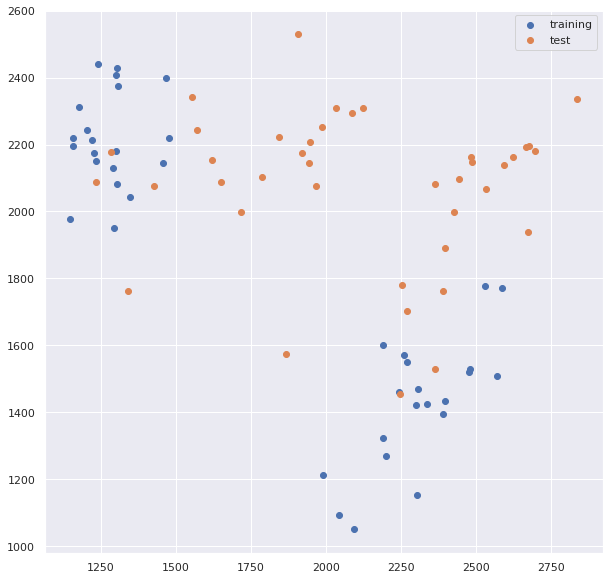

In [66]:
import matplotlib.pyplot as plt

# Use KMeans for identification(finding the most similar image to the images being tested)
y_transform = km.transform(X)
y_testACBD_transform = km.transform(X_testACBD)

# Show a scatter of the train and test distance points
plt.figure(figsize=(10,10))
plt.scatter(y_transform[:, 0], y_transform[:, 1], label='training')
plt.scatter(y_testACBD_transform[:, 0], y_testACBD_transform[:, 1], label='test')
plt.legend(loc='best')

def find_closest_point_pairs(y, y_test):
  closest_points = []
  # Find the closest point for every test image
  for i in range(len(y_test)):
    min_distance = np.Infinity
    closest_point = 0
    for j in range(len(y)):
      # Calculate distance between two points
      distance = np.sqrt(np.sum(np.power(y[j] - y_test[i], 2)))
      if(distance < min_distance):
        min_distance = distance
        closest_point = j

    closest_points.append([i, closest_point])
    
  print("Most similar image for every test image(subjects A, B, C and D):")
  print(closest_points)

  return closest_points

closest_points = find_closest_point_pairs(y_transform, y_testACBD_transform)

Similar to section 5.2.1, we extract the most similar face-pairs in the dataset

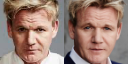

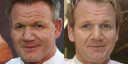

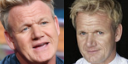

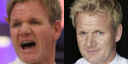

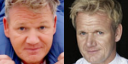

...

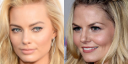

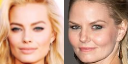

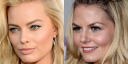

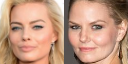

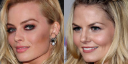

In [67]:
def show_identified_images(points):
  for point_pair in points:
    test_image_id = point_pair[0]
    match_image_id = point_pair[1]

    # Get corresponding test image
    if(test_image_id < 10):
      test_image = subj_dict["SubjectA_GR"]["images_test"][test_image_id]
    elif(test_image_id < 20):
      test_image = subj_dict["SubjectC_HL"]["images"][test_image_id-10]
    elif(test_image_id < 30):
      test_image = subj_dict["SubjectB_JM"]["images_test"][test_image_id-20]
    else:
      test_image = subj_dict["SubjectD_MR"]["images"][test_image_id-30]

    # Get most similar image
    if(match_image_id < 20):
      match_image = subj_dict["SubjectA_GR"]["images"][match_image_id]
    else:
      match_image = subj_dict["SubjectB_JM"]["images"][match_image_id-20]

    # Horizontally stack images
    match = np.hstack((test_image, match_image))
    cv2_imshow(match)

show_identified_images(closest_points)

## 5.3 Impress your TA's


### 5.3.1 HOG using rotated images

To test the robustness of the HOG descriptor, the test images for subjects A and B are rotated anti-clockwise over $90°$. The following code block rotates these images and overwrites the original test images...

In [68]:
subj_dict = {
    "SubjectA_GR": {
        "nimages": 20,
        "images": [],
        "nimages_test": 10,
        "images_test": [],
        "fvectors_hog": [],
        "fvectors_hog_test": []
    },
    "SubjectB_JM": {
        "nimages": 20,
        "images": [],
        "nimages_test": 10,
        "images_test": [],
        "fvectors_hog": [],
        "fvectors_hog_test": []
    },
    "SubjectC_HL": {
        "nimages": 10,
        "images": [],
        "fvectors_hog": []
    },
    "SubjectD_MR": {
        "nimages": 10,
        "images": [],
        "fvectors_hog": []
    }
}

download_images()

for celeb in {"SubjectB_JM","SubjectA_GR"}:
  for i in range(0,len(subj_dict[celeb]["images_test"])):
    img = subj_dict[celeb]["images_test"][i]
    h, w, z = img.shape

    M = cv2.getRotationMatrix2D((w/2, h/2), 90, 1)
    rotated = cv2.warpAffine(img, M, (w, h))

    subj_dict[celeb]["images_test"][i] = rotated

...done!


Now we recompute the HOG feature vectors and retest using the previously trained model.

In [69]:
computeHOG()

fvectors_A_test = subj_dict["SubjectA_GR"]["fvectors_hog_test"]
fvectors_B_test = subj_dict["SubjectB_JM"]["fvectors_hog_test"]

X_test = np.concatenate((fvectors_A_test, fvectors_B_test), axis=0)
y_test = np.concatenate((np.zeros(len(fvectors_A_test)), np.ones(len(fvectors_B_test))))

Y_pred = clf_hog.predict(X_test)
print("Accuracy of the model for classifying A/B: {}%".format(100 * np.sum(Y_pred == y_test) / len(Y_pred)))


Accuracy of the model for classifying A/B: 65.0%


Seeing as the accuracy is no longer 100%, it is useful to plot the confusion matrix

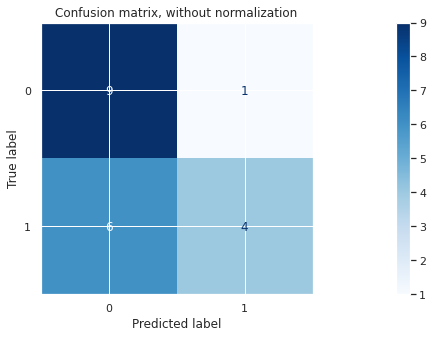

In [70]:
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import plot_confusion_matrix
import matplotlib.pyplot as plt

titles_options = [("Confusion matrix, without normalization", None)]
class_names = [0,1]

for title, normalize in titles_options:
    disp = plot_confusion_matrix(clf_hog, X_test, y_test,
                                 display_labels=class_names,
                                 cmap=plt.cm.Blues,
                                 normalize=None)
    disp.ax_.set_title(title)

plt.show()

**General remarks**:

* Maybe some more information in text. Specifically the part about transfer learning (classification) contains only code blocks for now.
* Some TODOs between the text. For example: how and why do the 3 feature representations behave differently ?
* Discussion

Everything else should work when the code is ran sequentially. I thought about it, and I don't think it makes any sense for classification to be ran without initializing the data / features first. I added some checks so the code gives a personalised exception when these cells aren't ran first, but that's it for now.

### 5.3.2 HOG classification and identification of obstructed images

As an extra exercise, we will partially cover the faces on our dataset and test if HOG is able to continue working well.

First, we load the data and partially obstruct the faces. For this task we weill remove half of the image pixels (32 out of 64).

...done!


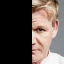

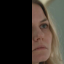

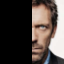

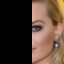

In [71]:
subj_dict = {
    "SubjectA_GR": {
        "nimages": 20,
        "images": [],
        "nimages_test": 10,
        "images_test": [],
        "fvectors_hog": [],
        "fvectors_hog_test": []
    },
    "SubjectB_JM": {
        "nimages": 20,
        "images": [],
        "nimages_test": 10,
        "images_test": [],
        "fvectors_hog": [],
        "fvectors_hog_test": []
    },
    "SubjectC_HL": {
        "nimages": 10,
        "images": [],
        "fvectors_hog": []
    },
    "SubjectD_MR": {
        "nimages": 10,
        "images": [],
        "fvectors_hog": []
    }
}

download_images()

# load test images
imgs_A = subj_dict["SubjectA_GR"]["images_test"]
imgs_B = subj_dict["SubjectB_JM"]["images_test"]
imgs_C = subj_dict["SubjectC_HL"]["images"]
imgs_D = subj_dict["SubjectD_MR"]["images"]

# for every test image
for celeb in subj_dict:
  for i in range(len(imgs_A)):
    # remove 32 rows from the image
    for j in range(32):
      imgs_A[i][:, j, :] = 0
      imgs_B[i][:, j, :] = 0
      imgs_C[i][:, j, :] = 0
      imgs_D[i][:, j, :] = 0

# show the result on one image of each subject
cv2_imshow(imgs_A[0])
cv2_imshow(imgs_B[0])
cv2_imshow(imgs_C[0])
cv2_imshow(imgs_D[0])

Now we need to recompute the HOG feature vectors for the modified dataset:

In [0]:
computeHOG()

We can now use KMeans to identify the most similar image to each of our partially obstructed images:

Accuracy of the model on training data AB: 100.0%
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1]
Accuracy of the model on test data ACBD: 85.0%
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1]
[0 1 1 0 0 0 1 0 0 1 0 0 0 1 0 0 1 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1]
Most similar image for every test image(subjects A, B, C and D):
[[0, 4], [1, 30], [2, 30], [3, 30], [4, 30], [5, 30], [6, 30], [7, 30], [8, 30], [9, 30], [10, 30], [11, 30], [12, 30], [13, 30], [14, 30], [15, 30], [16, 30], [17, 30], [18, 30], [19, 30], [20, 30], [21, 30], [22, 30], [23, 30], [24, 30], [25, 30], [26, 30], [27, 30], [28, 30], [29, 30], [30, 30], [31, 30], [32, 30], [33, 30], [34, 30], [35, 30], [36, 30], [37, 30], [38, 30], [39, 30]]


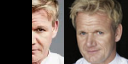

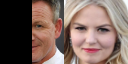

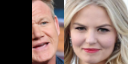

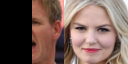

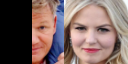

...

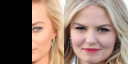

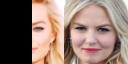

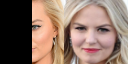

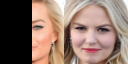

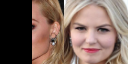

In [73]:
# Train data
fvectors_A = subj_dict["SubjectA_GR"]["fvectors_hog"]
fvectors_B = subj_dict["SubjectB_JM"]["fvectors_hog"]
# Test data
fvectors_A_test = subj_dict["SubjectA_GR"]["fvectors_hog_test"]
fvectors_B_test = subj_dict["SubjectB_JM"]["fvectors_hog_test"]
fvectors_C_test = subj_dict["SubjectC_HL"]["fvectors_hog"]
fvectors_D_test = subj_dict["SubjectD_MR"]["fvectors_hog"]

X = np.concatenate((fvectors_A, fvectors_B), axis=0)
Y = np.concatenate((np.zeros(len(fvectors_A)), np.ones(len(fvectors_B))))

X_testACBD = np.concatenate((fvectors_A_test, fvectors_C_test, fvectors_B_test, fvectors_D_test), axis=0)

# Fit KMeans model to predict data class
# n_clusters = 2, corresponding to subjects A and B
km = KMeans(
    n_clusters=2, init='random',
    n_init=10, max_iter=300, 
    tol=1e-04, random_state=0
)

km.fit_predict(X)

# Use KMeans for classification
y_km = km.fit_predict(X)
print("Accuracy of the model on training data AB: {}%".format(100 * np.sum(y_km == Y) / len(y_km)))
print(Y.astype(int))
print(y_km)

y_testACBD = km.predict(X_testACBD)
print("Accuracy of the model on test data ACBD: {}%".format(100 * np.sum(y_testACBD == Y_testACBD) / len(y_testACBD)))
print(Y_testACBD.astype(int))
print(y_testACBD)

# Find closest point pairs
y_transform = km.transform(X)
y_testACBD_transform = km.transform(X_testACBD)
closest_points = find_closest_point_pairs(y_transform, y_testACBD_transform)

# Show the identified pairs
show_identified_images(closest_points)

As we can see, classification still works pretty well (85% accuracy), but our identification algorithm is completely useless with obstructed images.

# 6. Discussion

## 6.1. What we have learned

1. First, we have learned how to build, extract and preprocess a faces dataset.

2. We have also learned that we can use different feature representations to classify and identify new images of the same (or a significantly similar) person. We have seen how each of the 3 studied methods behave with the same given dataset.

  Every feature representation has its own unique way of capturing the essence of a person's face, that is to say, extracting features. Hence, a method may work better or worse depending on data being analyzed:
  - HOG uses gradients
  - PCA uses eigenfaces
  - TL uses a pre-trained neural network

3. As we have seen, HOG and TL scored 100% accuracy for classification of test images, whereas PCA had an accuracy of 80%. This can be explained by the way PCA works: while reducing the dimensionality of the feature vector, we lose data, so the accuracy inherently diminishes.

4. For the identification task, we see the same behavior, HOG and TL perform better than PCA. 

5. One important remark about hand-crafted vs learning from data is that hand-crafted features give the researchers a liberty to choose the feature extraction methods best suited for their data. A positive aspect of this is that someone with a domain expertise can make an optimal use of the best suited technique. As compared with TL-based approach, where the feature extraction follows sequential extraction in each layer. 

6. Hand-crafted features, although showing promising results on the current  dataset, are computationally expensive if data is scaled up. 

7. Transfer learning having already been trained on a large dataset is ideal in scenarios where the data sizes are significantly different.

8. All in all, the results are excellent (except for PCA), so extra time would not really be useful in terms of optimizing it. We could try training/testing with more images or more similar faces so we have more evidence that our classifier works as well as it seems.

9. As an extra exercise, we have explored the behavior of the HOG algorithm with rotated and obstructed images, and we have been able to determine that classification still works decently (better for obstructed images than for rotated images), but our identification algorithm is completely made obsolete. We conclude then that HOG is not able to deal with obstructed images for identification tasks.

### 6.1.1 Remarks on PCA

PCA is also based on the variation of the pixel data between faces, so the information is mostly contained on a pixel-by-pixel basis which does not really represent any facial features.

PCA, while being a well-known method for data compression, has severe limitations in the specific task of face recognition. The reason is that it looks at faces with an holistic approach without really extracting and recongizing typical face features. This means that the method is sensitive to scale and pose, and that's why it requires some serious preprocessing. Moreover, PCA suffers when backgrounds differ significantly, having a profound impact on classification and identification performance. This is mainly due to the illumination variance captured along the 2 first principal components.

On the other hand, PCA offers simplicity and high efficiency due to its data compression DNA compared to the other techniques used. Overall, however, given that being able to cope with difference in pose, illumination and scale are very relevant factors to take into account for image classification/identification task, PCA has some serious limitations compared with the other 2 methods. 

Finally, the aforementioned limitations make PCA a less convenient solution compared to HOG, which exploits the extraction of features specific of human faces, and Transfer Learning, which is based on a precomputed NN trained on a lot of data. 

## 6.2. Would it be easy to fool this face identification system? How could we improve it?

Requiring classification for employees results in having to gather a lot of pictures of $N$ persons, resulting in a $N$-ary classifier. This will most likely result in a higher amount of false classifications. On top of that, we preprocessed the images offline by centralizing the faces. In an office setting, it would be nearly impossible to capture these kind of high-quality frontal facial photos due to camera angles / different settings (eg. time of day). One could try training the classifier with these types of images, but our results would not be representative of this since we trained on preprocessed images. 

Our advice for the company would be the following:
- The cameras should be placed in good positions and collect huge quantities of labeled data in order to train a good model. 
- This system could also be paired with a more traditional RFID card system, which could be the plan B in case the facial detection algorithm is not certain enough of who is the person trying to enter.

Current limitations and how to improve:
- The images have to be preprocessed offline. This should be adapted by finding a way to do this automatically with openCV.
- Rotated / obstructed images: our current models do not work well with this kind of images. We should find another feature representation which is rotation-invariant and use some kind of bagging technique to classify the right person.
- The current system is limited to 2D images, which could be easily fooled by printing an image of the face we want to pretend to be. Implementing 3D recognition technologies would improve the robustness of the system.